# **Porównanie podejść wstępnego przetwarzania danych graficznych typu CAPTCHA i ich wpływ na skuteczność predykcji**

# 1 Przygotowanie środowiska

W tej sekcji przygotujemy środowisko. Głównie zainstalujemy moduł do mierzenia czasu działania operacji z komórek oraz moduł do obliczenia funkcji straty i skuteczności. Importujemy niezbędne moduły dla pracy w notatniku.

In [1]:
!pip install ipython-autotime
%load_ext autotime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 5.0 MB/s 
time: 368 µs (started: 2022-12-28 08:17:48 +00:00)


In [2]:
!pip install torchmetrics==0.10.3

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 529 kB 5.0 MB/s 
time: 3.43 s (started: 2022-12-28 08:17:48 +00:00)


In [3]:
import gc
import cv2
import os, glob
import torch
import numpy as np
import pandas as pd
import torchmetrics
import torch.nn as nn
import torchvision.utils
from torch import Tensor
import torch.nn.functional as F
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, TensorDataset, random_split
import matplotlib.pyplot as plt
import matplotlib.image as img
from PIL import Image, ImageDraw, ImageFont
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from tqdm.autonotebook import tqdm

time: 4.76 s (started: 2022-12-28 08:17:51 +00:00)


Zapoznajmy się z parametrami karty graficznej

In [4]:
!nvidia-smi

Tue Dec 27 21:07:29 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   48C    P0    27W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# 2 Odszumianie obrazów przy wykorzytaniu autoenkodera



## 2.1 Pobieranie i przygotowanie danych

Aby zastosować metodę odszumiania obrazów za pośrednictwem autoenkodera, najpierw jest potrzebne wytrenować siec na danych podobnych do oryginalnych obrazów. Skoro oryginalne obrazy mamy litery i liczby, to wygenerujemy obrazy z takimi symbolami. Do generacji takich obrazów skorzystamy z oryginalnych czcionek środowiska Windows. Więc pobierzmy ich z Google Disk i rozpakujemy.

In [4]:
# Pobieramy standartowe czcionki środowiska Windows
!pip install --upgrade --no-cache-dir gdown
!gdown --id 1TIsvGACSrQOr1tgPaVpJebH375LjLIV6
!unzip /content/Windows7DefaultFonts.zip -d /content/fonts

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Attempting uninstall: gdown
    Found existing installation: gdown 4.4.0
    Uninstalling gdown-4.4.0:
      Successfully uninstalled gdown-4.4.0
/usr/local/lib/python3.8/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1TIsvGACSrQOr1tgPaVpJebH375LjLIV6
To: /content/Windows7DefaultFonts.zip
100% 191M/191M [00:02<00:00, 94.9MB/s]
Archive:  /content/Windows7DefaultFonts.zip
   creating: /content/fonts/Windows7DefaultFonts/
  inflating: /content/fonts/Windows7DefaultFonts/8514fix.fon  
  inflating: /content/fonts/Windows7DefaultFonts/8514fixe.fon  
  inflating: /content/fonts/Windows7DefaultFonts/8514fixg.fon  
  inflating: /content/fonts/Windows7DefaultFonts/8514fixr.fon  
  inflating: /content/font

In [5]:
# Pobieramy captcha dataset z gdrive and unzip
!gdown --id 1QJ3ESxhCclRiQtF6AXno-ZU3vnhnEMub  
!unzip /content/captcha-version-2-images.zip -d /content/captcha-version-2-images

/usr/local/lib/python3.8/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1QJ3ESxhCclRiQtF6AXno-ZU3vnhnEMub
To: /content/captcha-version-2-images.zip
100% 18.3M/18.3M [00:00<00:00, 20.1MB/s]
Archive:  /content/captcha-version-2-images.zip
  inflating: /content/captcha-version-2-images/samples/226md.png  
  inflating: /content/captcha-version-2-images/samples/22d5n.png  
  inflating: /content/captcha-version-2-images/samples/2356g.png  
  inflating: /content/captcha-version-2-images/samples/23mdg.png  
  inflating: /content/captcha-version-2-images/samples/23n88.png  
  inflating: /content/captcha-version-2-images/samples/243mm.png  
  inflating: /content/captcha-version-2-images/samples/244e2.png  
  inflating: /content/captcha-version-2-images/samples/245y5.png  
  inflating: /content/captcha-ve

Po rozpakowaniu się danych wygenerujemy na podstawie pobranych standardowych czcionek Windows obrazki z pojedynczymi symboli.

In [6]:
! mkdir /content/symbols/

parentPath = "/content/symbols/"
charactersList = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l',
                  'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x',
                  'y', 'z', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J',
                  'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V',
                  'W', 'X', 'Y', 'Z', '0', '1', '2', '3', '4', '5', '6', '7',
                  '8', '9']
fontTypes = []
for font in glob.glob("/content/fonts/Windows7DefaultFonts/*"):
    # Przepisuje wszystkie nazwy czcionek do listy
    fontTypes.append(os.path.abspath(font))
fonts_list = [i for i in fontTypes if i.endswith('.ttf')]

time: 138 ms (started: 2022-12-28 08:18:20 +00:00)


In [7]:
# Generuje i zapisuje obrazy na podstawie listy czcionek
for index, character in enumerate(charactersList):
    path = os.path.join(parentPath, character)
    if not os.path.exists(path):
        os.mkdir(path)
    for imageCounter in range(len(fonts_list)):
        for repeats in range(3):
            # Numer obrazów do jednej czcionki
            fnt = ImageFont.truetype(fonts_list[imageCounter], 15)
            w, h = fnt.getsize(character)
            # Dodaje 20 pixeli padding (10 pixeli dla każdej strony)
            img_w, img_h = w + 20, h + 20
            img = Image.new('L', (img_w, img_h), color='white')
            # Replace '1' with 'L' (8-bit pixels, black and white - we fill 255 so we can't use 1 bit per pixel)
            d = ImageDraw.Draw(img)
            d.text(((img_w-w)/2, (img_h-h)/2), character, font=fnt, fill=0, align="center")  # TO ALIGN CHARACTER IN CENTER
            img.save(path + "//" + str(imageCounter) + "_" + str(repeats) + ".jpg")

time: 28.5 s (started: 2022-12-28 08:18:20 +00:00)


Jednym ze sposobów do stworzenia zbioru danych jest zapisanie wszelkich informacji o danych uczących jako bazę danych Pandas. 

In [8]:
# Przygotowanie do zapisu danych
symbols = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 'a', 'b', 'c', 'd', 'e', 'f',
           'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r',
           's', 't', 'u', 'v', 'w', 'x', 'y', 'z', 'A', 'B', 'C', 'D',
           'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P',
           'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']
changed_su = LabelEncoder().fit_transform(symbols)
su_ohe = OneHotEncoder(sparse=False).fit_transform(changed_su.reshape(len(changed_su), 1))

time: 11.2 ms (started: 2022-12-28 08:18:49 +00:00)


In [9]:
# Generacja oraz zapis danych jako Pandas DataFrame
path = ('/content/symbols/')
labels = []
src_lab = []
imgs = []
list_n_n = []
oneh_a = []
path_list = []
counter = 0
while len(path_list) != len(symbols):
    for i in range(len(symbols)):
        path_num = str(path) + str(symbols[i])
        path_list.append(path_num)
        imgs.append([])
        counter += 1
for i in range(len(symbols)):
    sorted_symbols = sorted(os.listdir(path_list[symbols.index(symbols[i])]))
    for img_symb in sorted_symbols:
        if img_symb.endswith(('.jpg', '.png')):
            imgs[i].append(img_symb)

list_n_n = sum(imgs, [])
for q in range(len(symbols)):
    for m in range(len(imgs[q])):
        oneh_a.append(su_ohe[symbols.index(symbols[q])])
        labels.append(q)
        src_lab.append(path_list[q])
        df_symbols = pd.DataFrame(list(zip(list_n_n,
                                           labels,
                                           oneh_a,
                                           src_lab)),
                                  columns=['name',
                                           'labels',
                                           'one_label',
                                           'source'])

time: 5min 57s (started: 2022-12-28 08:18:49 +00:00)


Po generacji bazy danych zapiszmy ją jako plik .csv

In [10]:
df_symbols.to_csv('/content/dataset.csv')
df_symbols

,name,labels,one_label,source
0,0_0.jpg,0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",/content/symbols/0
1,0_1.jpg,0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",/content/symbols/0
2,0_2.jpg,0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",/content/symbols/0
3,100_0.jpg,0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",/content/symbols/0
4,100_1.jpg,0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",/content/symbols/0
...,...,...,...,...
42217,99_1.jpg,61,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",/content/symbols/Z
42218,99_2.jpg,61,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",/content/symbols/Z
42219,9_0.jpg,61,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",/content/symbols/Z
42220,9_1.jpg,61,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",/content/symbols/Z


time: 15 s (started: 2022-12-28 08:26:16 +00:00)


Na podstawie wygenerowanych obrazów i bazy danych stworzymy zbiór danych. Również niezbędnie jest podział otrzymanych danych na zbiór treningowy i walidacyjny.

In [11]:
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, csv_path):
        self.df = pd.read_csv(csv_path)

    def __len__(self):
        return len(self.df)

    def __getitem__(self, index):
        filename = self.df["name"][index]
        label = self.df["one_label"][index]
        image = Image.open(os.path.join(self.df["source"][index], filename))
        transform = transforms.Compose([transforms.Resize((40, 20)),
                                        transforms.Grayscale(num_output_channels=1),
                                        transforms.ToTensor(),
                                        transforms.Normalize((0.5), (0.5))])
        image = transform(image)
        return image, label

time: 4.45 ms (started: 2022-12-28 08:26:37 +00:00)


In [12]:
dataset = CustomDataset("/content/dataset.csv")
total_size = len(dataset)
train_size = int(total_size * 0.9)
val_size = int(total_size - train_size)
train_dataset, val_dataset = random_split(dataset,
                                          [train_size, val_size],
                                          generator=torch.Generator().manual_seed(2))
train_dataloader = torch.utils.data.DataLoader(train_dataset,
                                               batch_size=64,
                                               shuffle=True,
                                               num_workers=4)
val_dataloader = torch.utils.data.DataLoader(val_dataset,
                                             batch_size=64,
                                             shuffle=True,
                                             num_workers=4)

time: 162 ms (started: 2022-12-28 08:26:39 +00:00)


/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Oczyszczenie cache GPU w aktualnej sesji Colab dla dalszych testów.

In [13]:
model = None
autoencoder = None
gc.collect()
with torch.no_grad():
    torch.cuda.empty_cache()

time: 132 ms (started: 2022-12-28 08:26:45 +00:00)


## 2.2 Implementacja i trenowanie autoenkodera

Bardziej szczegółowo architektura autoenkodera opisana w pkt 2.6 opisowej części pracy.

Parametry sieci:

In [14]:
num_epochs = 10
learning_rate = 1e-3
weight_decay = 1e-5
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

time: 731 ms (started: 2022-12-28 08:26:46 +00:00)


Implementacja autoenkodera 

In [15]:
# Autoenkoder AEFPNC
class FeaturePyramidNetwork(nn.Module):
    def __init__(self):
        super(FeaturePyramidNetwork, self).__init__()
        self.name = "AEFPNC"
        self.bn0 = nn.BatchNorm2d(1)
        self.conv1 = nn.Conv2d(in_channels=1,
                               out_channels=16,
                               kernel_size=3,
                               padding=1)  # 3x256x256 -> 16x256x256
        self.bn1 = nn.BatchNorm2d(num_features=16)
        self.conv2 = nn.Conv2d(in_channels=16,
                               out_channels=32,
                               kernel_size=3,
                               padding=1)  # 16x256x256 -> 32x256x256
        self.bn2 = nn.BatchNorm2d(num_features=32)
        self.conv3 = nn.Conv2d(in_channels=32,
                               out_channels=64,
                               kernel_size=3,
                               padding=1)  # 32x256x256 -> 64x256x256
        self.bn3 = nn.BatchNorm2d(num_features=64)
        self.conv4 = nn.Conv2d(in_channels=64,
                               out_channels=48,
                               kernel_size=3,
                               padding=1)  # 64x256x256 -> 48x256x256
        self.bn4 = nn.BatchNorm2d(num_features=48)
        self.conv5 = nn.Conv2d(in_channels=48,
                               out_channels=32,
                               kernel_size=3,
                               padding=1)  # 48x256x256 -> 32x256x256
        self.bn5 = nn.BatchNorm2d(num_features=32)
        self.conv6 = nn.Conv2d(in_channels=32,
                               out_channels=32,
                               kernel_size=3,
                               padding=1)  # 32x256x256 -> 24x256x256
        self.bn6 = nn.BatchNorm2d(num_features=32)
        self.conv7 = nn.Conv2d(in_channels=32,
                               out_channels=16,
                               kernel_size=3,
                               padding=1)  # 24x256x256 -> 16x256x256
        self.bn7 = nn.BatchNorm2d(num_features=16)
        self.down = nn.Conv2d(in_channels=64,
                              out_channels=64,
                              kernel_size=3,
                              padding=1,
                              stride=2)
        self.conv_smooth1 = nn.Conv2d(in_channels=64,
                                      out_channels=32,
                                      kernel_size=3,
                                      padding=1)
        self.conv_smooth2 = nn.Conv2d(in_channels=32,
                                      out_channels=16,
                                      kernel_size=3,
                                      padding=1)
        self.conv_smooth3 = nn.Conv2d(in_channels=16,
                                      out_channels=16,
                                      kernel_size=3,
                                      padding=1)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()
        self.convtrans1 = nn.ConvTranspose2d(in_channels=16,
                                             out_channels=24,
                                             kernel_size=3,
                                             padding=1)
        self.convtrans2 = nn.ConvTranspose2d(in_channels=24,
                                             out_channels=32,
                                             kernel_size=3,
                                             padding=1)
        self.convtrans3 = nn.ConvTranspose2d(in_channels=32,
                                             out_channels=48,
                                             kernel_size=3,
                                             padding=1)
        self.convtrans4 = nn.ConvTranspose2d(in_channels=48,
                                             out_channels=64,
                                             kernel_size=3,
                                             padding=1)
        self.convtrans5 = nn.ConvTranspose2d(in_channels=64,
                                             out_channels=32,
                                             kernel_size=3,
                                             padding=1)
        self.convtrans6 = nn.ConvTranspose2d(in_channels=32,
                                             out_channels=16,
                                             kernel_size=3,
                                             padding=1)
        self.convtrans7 = nn.ConvTranspose2d(in_channels=16,
                                             out_channels=1,
                                             kernel_size=3,
                                             padding=1)

    def forward(self, x):
        # ============ Encoder ===========
        # ====== Bottom Up Layers =====
        x = self.bn0(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = self.bn1(x)
        x = self.conv2(x)
        x = self.relu(x)
        x = self.bn2(x)
        x = self.conv3(x)
        x = self.relu(x)
        x = self.bn3(x)
        _, _, H1, W1 = x.size()
        # ======= Branch network ======
        x_d1 = self.down(x)  # 128x128
        _, _, H2, W2 = x_d1.size()
        x_d2 = self.down(x_d1)  # 64x64
        _, _, H3, W3 = x_d2.size()
        x_d3 = self.down(x_d2)  # 32x32
        # ======= First Branch =======
        x = self.conv4(x)
        x = self.relu(x)
        x = self.bn4(x)
        x = self.conv5(x)
        x = self.relu(x)
        x = self.bn5(x)
        x = self.conv6(x)
        x = self.relu(x)
        x = self.bn6(x)
        x = self.conv7(x)
        x = self.relu(x)
        x = self.bn7(x)
        # ======= Second Branch ========
        x_d1 = self.conv4(x_d1)
        x_d1 = self.relu(x_d1)
        x_d1 = self.bn4(x_d1)
        x_d1 = self.conv5(x_d1)
        x_d1 = self.relu(x_d1)
        x_d1 = self.bn5(x_d1)
        x_d1 = self.conv6(x_d1)
        x_d1 = self.relu(x_d1)
        x_d1 = self.bn6(x_d1)
        x_d1 = self.conv7(x_d1)
        x_d1 = self.relu(x_d1)
        x_d1 = self.bn7(x_d1)
        x_d1 = self.upsample(x_d1, size=(H1, W1))
        # ======= Third Branch ========
        x_d2 = self.conv4(x_d2)
        x_d2 = self.relu(x_d2)
        x_d2 = self.bn4(x_d2)
        x_d2 = self.conv5(x_d2)
        x_d2 = self.relu(x_d2)
        x_d2 = self.bn5(x_d2)
        x_d2 = self.conv6(x_d2)
        x_d2 = self.relu(x_d2)
        x_d2 = self.bn6(x_d2)
        x_d2 = self.conv7(x_d2)
        x_d2 = self.relu(x_d2)
        x_d2 = self.bn7(x_d2)
        x_d2 = self.upsample(x_d2, size=(H2, W2))
        x_d2 = self.upsample(x_d2, size=(H1, W1))
        # ======= Fourth Branch ========
        x_d3 = self.conv4(x_d3)
        x_d3 = self.relu(x_d3)
        x_d3 = self.bn4(x_d3)
        x_d3 = self.conv5(x_d3)
        x_d3 = self.relu(x_d3)
        x_d3 = self.bn5(x_d3)
        x_d3 = self.conv6(x_d3)
        x_d3 = self.relu(x_d3)
        x_d3 = self.bn6(x_d3)
        x_d3 = self.conv7(x_d3)
        x_d3 = self.relu(x_d3)
        x_d3 = self.bn7(x_d3)
        x_d3 = self.upsample(x_d3, size=(H3, W3))
        x_d3 = self.upsample(x_d3, size=(H2, W2))
        x_d3 = self.upsample(x_d3, size=(H1, W1))
        # ======= Concat maps ==========
        x = torch.cat((x, x_d1, x_d2, x_d3), 1)
        x = self.conv_smooth1(x)
        x = self.conv_smooth2(x)
        x = self.conv_smooth3(x)
        # ============ Decoder ==========
        x = self.convtrans1(x)
        x = self.relu(x)
        x = self.convtrans2(x)
        x = self.relu(x)
        x = self.convtrans3(x)
        x = self.relu(x)
        x = self.convtrans4(x)
        x = self.relu(x)
        x = self.convtrans5(x)
        x = self.relu(x)
        x = self.convtrans6(x)
        x = self.relu(x)
        x = self.convtrans7(x)
        x = self.sigmoid(x)
        return x

    def upsample(self, x, size):
        up = nn.Upsample(size=size, mode="bilinear")
        return up(x)


autoencoder = FeaturePyramidNetwork()
autoencoder = autoencoder.to(device)
num_params = sum(p.numel() for p in autoencoder.parameters() if p.requires_grad)
print('Number of parameters: %d' % num_params)

Number of parameters: 216779
time: 4.15 s (started: 2022-12-28 08:26:49 +00:00)


Pętla trenowania

In [16]:
optimizer = torch.optim.Adam(params=autoencoder.parameters(),
                             lr=learning_rate,
                             weight_decay=weight_decay)
autoencoder.train()
train_loss_avg = []

print('Training ...')
for epoch in range(num_epochs):
    train_loss_avg.append(0)
    num_batches = 0
    for image_batch, _ in train_dataloader:
        image_batch = image_batch.to(device)
        # autoencoder reconstruction
        image_batch_recon = autoencoder(image_batch)
        # reconstruction error
        loss = F.mse_loss(image_batch_recon, image_batch)
        # backpropagation
        optimizer.zero_grad()
        loss.backward()
        # one step of the optmizer (using the gradients from backpropagation)
        optimizer.step()
        train_loss_avg[-1] += loss.item()
        num_batches += 1
    train_loss_avg[-1] /= num_batches
    print('Epoch [%d / %d] average reconstruction error: %f' % (epoch+1, num_epochs, train_loss_avg[-1]))

Training ...
Epoch [1 / 10] average reconstruction error: 0.014076
Epoch [2 / 10] average reconstruction error: 0.005914
Epoch [3 / 10] average reconstruction error: 0.005738
Epoch [4 / 10] average reconstruction error: 0.005650
Epoch [5 / 10] average reconstruction error: 0.005588
Epoch [6 / 10] average reconstruction error: 0.005537
Epoch [7 / 10] average reconstruction error: 0.005500
Epoch [8 / 10] average reconstruction error: 0.005479
Epoch [9 / 10] average reconstruction error: 0.005481
Epoch [10 / 10] average reconstruction error: 0.005457
time: 4min 32s (started: 2022-12-28 08:26:55 +00:00)


Ewaluacja autoenkodera na zbiorze testowym

In [17]:
autoencoder.eval()
test_loss_avg, num_batches = 0, 0
for image_batch, _ in val_dataloader:
    with torch.no_grad():
        image_batch = image_batch.to(device)
        # autoencoder reconstruction
        image_batch_recon = autoencoder(image_batch)
        # reconstruction error
        loss = F.mse_loss(image_batch_recon, image_batch)
        test_loss_avg += loss.item()
        num_batches += 1
test_loss_avg /= num_batches
print('average reconstruction error: %f' % (test_loss_avg))

average reconstruction error: 0.011212
time: 2.2 s (started: 2022-12-28 08:32:19 +00:00)


## 2.3 Wyniki trenowania autoenkodera

W tej sekcji zapoznajmy się z wykresem krzywej trenowania oraz wizualizujemy zrekonstruowane obrazy.

Wykres krzywej trenowania

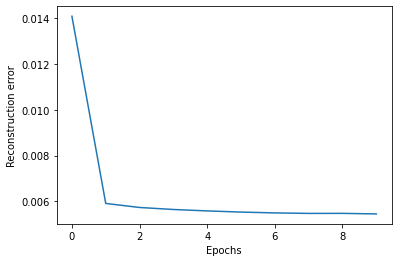

time: 135 ms (started: 2022-12-28 08:32:23 +00:00)


In [18]:
plt.ion()
fig = plt.figure()
plt.plot(train_loss_avg)
plt.xlabel('Epochs')
plt.ylabel('Reconstruction error')
plt.show()

Funkcje wspomagające wizualizacji rekonstrukcji

In [19]:
def to_img(x):
    x = 0.5 * (x + 1)
    x = x.clamp(0, 1)
    return x


def show_image(img):
    img = to_img(img)
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))


def visualise_output(images, model):
    model.eval()
    with torch.no_grad():
        images = images.to(device)
        images = model(images)
        images = images.cpu()
        images = to_img(images)
        np_imagegrid = torchvision.utils.make_grid(images[0:50], 10, 5).numpy()
        plt.imshow(np.transpose(np_imagegrid, (1, 2, 0)))
        plt.show()

time: 2.19 ms (started: 2022-12-28 08:32:29 +00:00)


Wizualizacja rekonstrukcji za pomocą niewytrenowanego i wytrenowanego modelu.

Original images


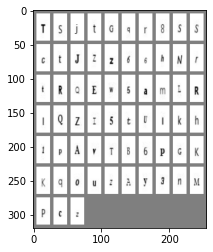

Autoencoder reconstruction: 


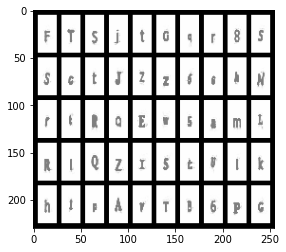

time: 700 ms (started: 2022-12-28 08:32:35 +00:00)


In [20]:
images, labels = next(iter(val_dataloader))

# Wizualizacja originalnych obrazków
print('Original images')
show_image(torchvision.utils.make_grid(images[1:100], 10, 5))
plt.show()

# Rekonstrukcja i wizualizacja obrazków poprzez dekoder
print('Autoencoder reconstruction: ')
visualise_output(images, autoencoder)

## 2.4 Przetwarzanie i przygotowanie zbioru danych

W tej sekcji przygotowywujemy obrazy wejściowe i tworzymy zbior danych. Po stworzeniu zbióru danych, on jest podzielony na zbiory: treningowy i walidacyjny.

In [21]:
X = []
y = []
for dirname, _, filenames in os.walk('/content/captcha-version-2-images/samples'):
    for filename in filenames:
        path = os.path.join(dirname, filename)
        image = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        x = [image[10:50, 30:50], image[10:50, 50:70],
             image[10:50, 70:90], image[10:50, 90:110], image[10:50, 110:130]]
        dim = (20, 40)
        transform = transforms.ToTensor()
        for i in range(5):
            X.append((transform(Image.fromarray(cv2.resize(x[i],
                                                           dim,
                                                           interpolation=cv2.INTER_AREA)))).numpy())
            y.append(path[len(path)-9:len(path)-4][i])
X = np.array(X)
y = np.array(y)
y_le = LabelEncoder().fit_transform(y)
y_ohe = OneHotEncoder(sparse=False).fit_transform(y_le.reshape(len(y_le), 1))
categories = y_ohe.shape[1]
info = {y_le[i]: y[i] for i in range(len(y))}

time: 3.53 s (started: 2022-12-28 08:32:45 +00:00)


In [22]:
# Próbki zostaną pobrane z pierwszego wymiaru (wiersza)
dataset = TensorDataset(Tensor(X), Tensor(y_ohe), )
total_size = len(dataset)
train_size = int(total_size * 0.6)
val_size = int(total_size - train_size)
train_dataset, val_dataset = random_split(dataset,
                                          [train_size, val_size],
                                          generator=torch.Generator().manual_seed(2))
train_loader = torch.utils.data.DataLoader(train_dataset,
                                           batch_size=150,
                                           shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset,
                                         batch_size=150,
                                         shuffle=True)

time: 8.03 ms (started: 2022-12-28 08:32:49 +00:00)


Wizualizacja rekonstrukcji pojedynczych symboli CAPTCHA za pomocą niewytrenowanego i wytrenowanego modelu.

Original images


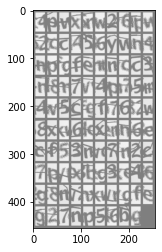

Autoencoder reconstruction: 


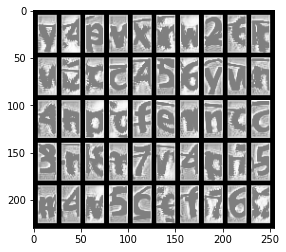

time: 292 ms (started: 2022-12-28 08:32:54 +00:00)


In [23]:
images, labels = next(iter(train_loader))

# Wizualizacja originalnych obrazków
print('Original images')
show_image(torchvision.utils.make_grid(images[1:100], 10, 5))
plt.show()

# Rekonstrukcja i wizualizacja obrazków poprzez dekoder
print('Autoencoder reconstruction: ')
visualise_output(images, autoencoder)

## 2.5 Implementacja i trenowanie modelu konwolucyjnego

Prosta siec konwolucyjna, która posiada 142387 parametrów.

In [24]:
# parameters for train network
epochs = 200
criterion = nn.MultiLabelSoftMarginLoss()
device = 'cuda' if torch.cuda.is_available() else 'cpu'
learning_rate = 1e-3

time: 966 µs (started: 2022-12-28 08:33:00 +00:00)


In [25]:
class CNNmodel(nn.Module):
    def __init__(self):
        super(CNNmodel, self).__init__()
        self.layers = nn.Sequential(nn.Conv2d(1, 16,
                                              kernel_size=(3, 3),
                                              padding=1),
                                    nn.ReLU(inplace=False),
                                    nn.MaxPool2d(kernel_size=(2, 2)),
                                    nn.Conv2d(16, 16,
                                              kernel_size=(3, 3),
                                              padding=1),
                                    nn.ReLU(inplace=False),
                                    nn.MaxPool2d(kernel_size=(2, 2)),
                                    nn.Conv2d(16, 32,
                                              kernel_size=(3, 3),
                                              padding=1),
                                    nn.ReLU(inplace=False),
                                    nn.MaxPool2d(kernel_size=(2, 2)),
                                    nn.Conv2d(32, 32,
                                              kernel_size=(3, 3),
                                              padding=1),
                                    nn.ReLU(inplace=False),
                                    nn.MaxPool2d(kernel_size=(2, 2)))
        self.linear1 = nn.Linear(64, 1500)
        self.dropout1 = nn.Dropout(0.4)
        self.linear2 = nn.Linear(1500, categories)
        self.dropout2 = nn.Dropout(0.2)

    def forward(self, X):
        X = self.layers(X)
        X = torch.flatten(X, start_dim=1)
        X = self.dropout1(X)
        X = self.linear1(X)
        X = F.relu(X, inplace=False)
        X = self.dropout2(X)
        X = self.linear2(X)
        X = F.log_softmax(X, dim=1)

        return X


model = CNNmodel()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
model.to(device)

CNNmodel(
  (layers): Sequential(
    (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU()
    (8): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (9): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (10): ReLU()
    (11): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  )
  (linear1): Linear(in_features=64, out_features=1500, bias=True)
  (dropout1): Dropout(p=0.4, inplace=False)
  (linear2): Linear(in_features=1500, out_features=19, bias=True)
  (dropout2): Dropout(p=0.2, inplace=False)
)

time: 14.5 ms (started: 2022-12-28 08:33:04 +00:00)


Trenowanie i ewaluacja sieci

In [26]:
batches = len(train_loader)
val_batches = len(val_loader)
train_accuracy = torchmetrics.Accuracy()
val_accuracy = torchmetrics.Accuracy()
acc_train_graph = []
acc_val_graph = []
train_loss_graph = []
val_loss_graph = []
train_acc_update = 0
val_acc_update = 0
for epoch in range(epochs):
    train_loss_unit = 0
    val_loss_unit = 0
    progress_train = tqdm(enumerate(train_loader),
                          desc="Loss: ",
                          total=batches)
    # ----------------- TRENOWANIE  --------------------
    model.train()
    for i, data in progress_train:
        data[0] = data[0].permute(0, 1, 2, 3).to(device)
        pic, index = autoencoder(data[0]), data[1].to(device)
        optimizer.zero_grad()
        outputs = model(pic)
        loss = criterion(outputs, index)
        loss.backward()
        optimizer.step()
        train_loss_unit += loss.item()
        train_acc_update = train_accuracy.update(outputs.cpu(),
                                                 torch.argmax(index.squeeze().cpu(),
                                                              dim=1))
    train_loss_graph.append(train_loss_unit)
    total_train_accuracy = train_accuracy.compute()
    acc_train_graph.append(total_train_accuracy)
    print('Epoch: %03d/%03d | Train loss %.3f | Train accuracy: %.3f%%' % (epoch+1, epochs, (sum(train_loss_graph)/len(train_loss_graph)), (total_train_accuracy)))
    # ----------------- WALIDACJA  --------------------
    model.eval()
    progress_val = tqdm(enumerate(val_loader),
                        desc="Loss: ",
                        total=val_batches)
    with torch.no_grad():
        for i, data in progress_val:
            data[0] = data[0].permute(0, 1, 2, 3).to(device)
            pic, index = autoencoder(data[0]), data[1].to(device)
            optimizer.zero_grad()
            outputs = model(pic)
            loss = criterion(outputs, index)
            actual_label = torch.argmax(index.cpu(), dim=1)
            predicted_label = torch.argmax(outputs, dim=1).cpu()
            val_loss_unit += loss.item()
            val_acc_update = val_accuracy.update(outputs.cpu(),
                                                 torch.argmax(index.squeeze().cpu(),
                                                              dim=1))
    val_loss_graph.append(val_loss_unit)
    total_val_accuracy = val_accuracy.compute()
    acc_val_graph.append(total_val_accuracy)
    print('Epoch: %03d/%03d | Validation loss %.3f | Validation accuracy: %.3f%% ' % (epoch+1, epochs, (sum(val_loss_graph)/len(val_loss_graph)), (total_val_accuracy)))

Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 001/200 | Train loss 8.787 | Train accuracy: 0.098%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 001/200 | Validation loss 5.678 | Validation accuracy: 0.139% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 002/200 | Train loss 7.895 | Train accuracy: 0.219%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 002/200 | Validation loss 4.635 | Validation accuracy: 0.362% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 003/200 | Train loss 7.029 | Train accuracy: 0.338%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 003/200 | Validation loss 3.975 | Validation accuracy: 0.495% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 004/200 | Train loss 6.387 | Train accuracy: 0.424%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 004/200 | Validation loss 3.566 | Validation accuracy: 0.573% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 005/200 | Train loss 5.912 | Train accuracy: 0.485%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 005/200 | Validation loss 3.289 | Validation accuracy: 0.623% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 006/200 | Train loss 5.547 | Train accuracy: 0.531%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 006/200 | Validation loss 3.071 | Validation accuracy: 0.662% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 007/200 | Train loss 5.252 | Train accuracy: 0.567%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 007/200 | Validation loss 2.908 | Validation accuracy: 0.690% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 008/200 | Train loss 5.011 | Train accuracy: 0.597%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 008/200 | Validation loss 2.778 | Validation accuracy: 0.713% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 009/200 | Train loss 4.815 | Train accuracy: 0.620%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 009/200 | Validation loss 2.671 | Validation accuracy: 0.731% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 010/200 | Train loss 4.648 | Train accuracy: 0.640%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 010/200 | Validation loss 2.583 | Validation accuracy: 0.746% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 011/200 | Train loss 4.499 | Train accuracy: 0.657%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 011/200 | Validation loss 2.504 | Validation accuracy: 0.760% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 012/200 | Train loss 4.369 | Train accuracy: 0.672%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 012/200 | Validation loss 2.440 | Validation accuracy: 0.770% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 013/200 | Train loss 4.258 | Train accuracy: 0.685%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 013/200 | Validation loss 2.382 | Validation accuracy: 0.780% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 014/200 | Train loss 4.157 | Train accuracy: 0.697%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 014/200 | Validation loss 2.330 | Validation accuracy: 0.788% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 015/200 | Train loss 4.066 | Train accuracy: 0.707%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 015/200 | Validation loss 2.283 | Validation accuracy: 0.796% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 016/200 | Train loss 3.985 | Train accuracy: 0.716%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 016/200 | Validation loss 2.245 | Validation accuracy: 0.802% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 017/200 | Train loss 3.910 | Train accuracy: 0.724%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 017/200 | Validation loss 2.209 | Validation accuracy: 0.809% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 018/200 | Train loss 3.840 | Train accuracy: 0.732%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 018/200 | Validation loss 2.176 | Validation accuracy: 0.814% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 019/200 | Train loss 3.776 | Train accuracy: 0.739%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 019/200 | Validation loss 2.145 | Validation accuracy: 0.819% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 020/200 | Train loss 3.718 | Train accuracy: 0.746%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 020/200 | Validation loss 2.117 | Validation accuracy: 0.824% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 021/200 | Train loss 3.662 | Train accuracy: 0.752%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 021/200 | Validation loss 2.092 | Validation accuracy: 0.828% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 022/200 | Train loss 3.611 | Train accuracy: 0.758%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 022/200 | Validation loss 2.067 | Validation accuracy: 0.832% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 023/200 | Train loss 3.564 | Train accuracy: 0.763%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 023/200 | Validation loss 2.045 | Validation accuracy: 0.835% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 024/200 | Train loss 3.519 | Train accuracy: 0.768%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 024/200 | Validation loss 2.024 | Validation accuracy: 0.839% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 025/200 | Train loss 3.477 | Train accuracy: 0.773%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 025/200 | Validation loss 2.004 | Validation accuracy: 0.842% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 026/200 | Train loss 3.437 | Train accuracy: 0.777%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 026/200 | Validation loss 1.985 | Validation accuracy: 0.845% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 027/200 | Train loss 3.400 | Train accuracy: 0.781%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 027/200 | Validation loss 1.968 | Validation accuracy: 0.848% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 028/200 | Train loss 3.365 | Train accuracy: 0.785%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 028/200 | Validation loss 1.952 | Validation accuracy: 0.850% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 029/200 | Train loss 3.331 | Train accuracy: 0.789%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 029/200 | Validation loss 1.937 | Validation accuracy: 0.853% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 030/200 | Train loss 3.300 | Train accuracy: 0.792%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 030/200 | Validation loss 1.923 | Validation accuracy: 0.855% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 031/200 | Train loss 3.271 | Train accuracy: 0.795%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 031/200 | Validation loss 1.909 | Validation accuracy: 0.857% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 032/200 | Train loss 3.242 | Train accuracy: 0.799%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 032/200 | Validation loss 1.896 | Validation accuracy: 0.859% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 033/200 | Train loss 3.214 | Train accuracy: 0.802%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 033/200 | Validation loss 1.884 | Validation accuracy: 0.861% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 034/200 | Train loss 3.188 | Train accuracy: 0.805%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 034/200 | Validation loss 1.872 | Validation accuracy: 0.863% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 035/200 | Train loss 3.162 | Train accuracy: 0.807%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 035/200 | Validation loss 1.861 | Validation accuracy: 0.865% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 036/200 | Train loss 3.139 | Train accuracy: 0.810%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 036/200 | Validation loss 1.850 | Validation accuracy: 0.867% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 037/200 | Train loss 3.115 | Train accuracy: 0.813%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 037/200 | Validation loss 1.840 | Validation accuracy: 0.868% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 038/200 | Train loss 3.093 | Train accuracy: 0.815%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 038/200 | Validation loss 1.830 | Validation accuracy: 0.870% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 039/200 | Train loss 3.072 | Train accuracy: 0.817%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 039/200 | Validation loss 1.821 | Validation accuracy: 0.871% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 040/200 | Train loss 3.052 | Train accuracy: 0.820%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 040/200 | Validation loss 1.813 | Validation accuracy: 0.873% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 041/200 | Train loss 3.032 | Train accuracy: 0.822%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 041/200 | Validation loss 1.805 | Validation accuracy: 0.874% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 042/200 | Train loss 3.013 | Train accuracy: 0.824%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 042/200 | Validation loss 1.796 | Validation accuracy: 0.875% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 043/200 | Train loss 2.994 | Train accuracy: 0.826%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 043/200 | Validation loss 1.788 | Validation accuracy: 0.877% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 044/200 | Train loss 2.977 | Train accuracy: 0.828%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 044/200 | Validation loss 1.780 | Validation accuracy: 0.878% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 045/200 | Train loss 2.960 | Train accuracy: 0.830%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 045/200 | Validation loss 1.772 | Validation accuracy: 0.879% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 046/200 | Train loss 2.944 | Train accuracy: 0.831%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 046/200 | Validation loss 1.766 | Validation accuracy: 0.880% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 047/200 | Train loss 2.927 | Train accuracy: 0.833%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 047/200 | Validation loss 1.759 | Validation accuracy: 0.881% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 048/200 | Train loss 2.912 | Train accuracy: 0.835%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 048/200 | Validation loss 1.752 | Validation accuracy: 0.882% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 049/200 | Train loss 2.897 | Train accuracy: 0.836%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 049/200 | Validation loss 1.745 | Validation accuracy: 0.884% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 050/200 | Train loss 2.883 | Train accuracy: 0.838%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 050/200 | Validation loss 1.739 | Validation accuracy: 0.885% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 051/200 | Train loss 2.869 | Train accuracy: 0.840%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 051/200 | Validation loss 1.733 | Validation accuracy: 0.886% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 052/200 | Train loss 2.855 | Train accuracy: 0.841%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 052/200 | Validation loss 1.727 | Validation accuracy: 0.887% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 053/200 | Train loss 2.842 | Train accuracy: 0.843%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 053/200 | Validation loss 1.721 | Validation accuracy: 0.888% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 054/200 | Train loss 2.829 | Train accuracy: 0.844%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 054/200 | Validation loss 1.716 | Validation accuracy: 0.889% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 055/200 | Train loss 2.816 | Train accuracy: 0.845%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 055/200 | Validation loss 1.711 | Validation accuracy: 0.889% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 056/200 | Train loss 2.804 | Train accuracy: 0.847%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 056/200 | Validation loss 1.706 | Validation accuracy: 0.890% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 057/200 | Train loss 2.793 | Train accuracy: 0.848%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 057/200 | Validation loss 1.700 | Validation accuracy: 0.891% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 058/200 | Train loss 2.780 | Train accuracy: 0.850%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 058/200 | Validation loss 1.696 | Validation accuracy: 0.892% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 059/200 | Train loss 2.769 | Train accuracy: 0.851%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 059/200 | Validation loss 1.691 | Validation accuracy: 0.893% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 060/200 | Train loss 2.758 | Train accuracy: 0.852%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 060/200 | Validation loss 1.686 | Validation accuracy: 0.893% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 061/200 | Train loss 2.747 | Train accuracy: 0.853%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 061/200 | Validation loss 1.682 | Validation accuracy: 0.894% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 062/200 | Train loss 2.737 | Train accuracy: 0.854%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 062/200 | Validation loss 1.678 | Validation accuracy: 0.895% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 063/200 | Train loss 2.727 | Train accuracy: 0.856%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 063/200 | Validation loss 1.674 | Validation accuracy: 0.896% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 064/200 | Train loss 2.716 | Train accuracy: 0.857%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 064/200 | Validation loss 1.670 | Validation accuracy: 0.896% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 065/200 | Train loss 2.707 | Train accuracy: 0.858%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 065/200 | Validation loss 1.666 | Validation accuracy: 0.897% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 066/200 | Train loss 2.697 | Train accuracy: 0.859%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 066/200 | Validation loss 1.662 | Validation accuracy: 0.898% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 067/200 | Train loss 2.688 | Train accuracy: 0.860%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 067/200 | Validation loss 1.658 | Validation accuracy: 0.898% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 068/200 | Train loss 2.679 | Train accuracy: 0.861%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 068/200 | Validation loss 1.654 | Validation accuracy: 0.899% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 069/200 | Train loss 2.670 | Train accuracy: 0.862%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 069/200 | Validation loss 1.650 | Validation accuracy: 0.900% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 070/200 | Train loss 2.661 | Train accuracy: 0.863%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 070/200 | Validation loss 1.647 | Validation accuracy: 0.900% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 071/200 | Train loss 2.652 | Train accuracy: 0.864%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 071/200 | Validation loss 1.643 | Validation accuracy: 0.901% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 072/200 | Train loss 2.643 | Train accuracy: 0.865%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 072/200 | Validation loss 1.640 | Validation accuracy: 0.901% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 073/200 | Train loss 2.635 | Train accuracy: 0.866%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 073/200 | Validation loss 1.636 | Validation accuracy: 0.902% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 074/200 | Train loss 2.627 | Train accuracy: 0.867%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 074/200 | Validation loss 1.633 | Validation accuracy: 0.903% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 075/200 | Train loss 2.619 | Train accuracy: 0.868%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 075/200 | Validation loss 1.630 | Validation accuracy: 0.903% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 076/200 | Train loss 2.612 | Train accuracy: 0.869%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 076/200 | Validation loss 1.627 | Validation accuracy: 0.904% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 077/200 | Train loss 2.604 | Train accuracy: 0.870%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 077/200 | Validation loss 1.625 | Validation accuracy: 0.904% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 078/200 | Train loss 2.597 | Train accuracy: 0.870%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 078/200 | Validation loss 1.622 | Validation accuracy: 0.905% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 079/200 | Train loss 2.591 | Train accuracy: 0.871%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 079/200 | Validation loss 1.619 | Validation accuracy: 0.905% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 080/200 | Train loss 2.583 | Train accuracy: 0.872%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 080/200 | Validation loss 1.616 | Validation accuracy: 0.906% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 081/200 | Train loss 2.577 | Train accuracy: 0.873%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 081/200 | Validation loss 1.614 | Validation accuracy: 0.906% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 082/200 | Train loss 2.570 | Train accuracy: 0.873%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 082/200 | Validation loss 1.611 | Validation accuracy: 0.906% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 083/200 | Train loss 2.563 | Train accuracy: 0.874%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 083/200 | Validation loss 1.608 | Validation accuracy: 0.907% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 084/200 | Train loss 2.556 | Train accuracy: 0.875%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 084/200 | Validation loss 1.606 | Validation accuracy: 0.907% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 085/200 | Train loss 2.549 | Train accuracy: 0.876%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 085/200 | Validation loss 1.604 | Validation accuracy: 0.908% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 086/200 | Train loss 2.544 | Train accuracy: 0.877%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 086/200 | Validation loss 1.601 | Validation accuracy: 0.908% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 087/200 | Train loss 2.537 | Train accuracy: 0.877%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 087/200 | Validation loss 1.599 | Validation accuracy: 0.909% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 088/200 | Train loss 2.531 | Train accuracy: 0.878%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 088/200 | Validation loss 1.596 | Validation accuracy: 0.909% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 089/200 | Train loss 2.525 | Train accuracy: 0.879%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 089/200 | Validation loss 1.594 | Validation accuracy: 0.909% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 090/200 | Train loss 2.519 | Train accuracy: 0.879%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 090/200 | Validation loss 1.592 | Validation accuracy: 0.910% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 091/200 | Train loss 2.514 | Train accuracy: 0.880%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 091/200 | Validation loss 1.590 | Validation accuracy: 0.910% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 092/200 | Train loss 2.508 | Train accuracy: 0.881%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 092/200 | Validation loss 1.587 | Validation accuracy: 0.911% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 093/200 | Train loss 2.502 | Train accuracy: 0.881%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 093/200 | Validation loss 1.585 | Validation accuracy: 0.911% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 094/200 | Train loss 2.496 | Train accuracy: 0.882%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 094/200 | Validation loss 1.583 | Validation accuracy: 0.912% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 095/200 | Train loss 2.491 | Train accuracy: 0.883%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 095/200 | Validation loss 1.581 | Validation accuracy: 0.912% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 096/200 | Train loss 2.485 | Train accuracy: 0.883%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 096/200 | Validation loss 1.579 | Validation accuracy: 0.912% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 097/200 | Train loss 2.480 | Train accuracy: 0.884%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 097/200 | Validation loss 1.577 | Validation accuracy: 0.913% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 098/200 | Train loss 2.474 | Train accuracy: 0.885%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 098/200 | Validation loss 1.576 | Validation accuracy: 0.913% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 099/200 | Train loss 2.469 | Train accuracy: 0.885%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 099/200 | Validation loss 1.574 | Validation accuracy: 0.913% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 100/200 | Train loss 2.464 | Train accuracy: 0.886%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 100/200 | Validation loss 1.572 | Validation accuracy: 0.914% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 101/200 | Train loss 2.460 | Train accuracy: 0.886%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 101/200 | Validation loss 1.570 | Validation accuracy: 0.914% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 102/200 | Train loss 2.454 | Train accuracy: 0.887%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 102/200 | Validation loss 1.568 | Validation accuracy: 0.914% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 103/200 | Train loss 2.449 | Train accuracy: 0.887%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 103/200 | Validation loss 1.566 | Validation accuracy: 0.915% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 104/200 | Train loss 2.444 | Train accuracy: 0.888%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 104/200 | Validation loss 1.565 | Validation accuracy: 0.915% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 105/200 | Train loss 2.440 | Train accuracy: 0.889%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 105/200 | Validation loss 1.563 | Validation accuracy: 0.915% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 106/200 | Train loss 2.435 | Train accuracy: 0.889%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 106/200 | Validation loss 1.561 | Validation accuracy: 0.916% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 107/200 | Train loss 2.430 | Train accuracy: 0.890%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 107/200 | Validation loss 1.560 | Validation accuracy: 0.916% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 108/200 | Train loss 2.425 | Train accuracy: 0.890%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 108/200 | Validation loss 1.558 | Validation accuracy: 0.916% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 109/200 | Train loss 2.421 | Train accuracy: 0.891%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 109/200 | Validation loss 1.557 | Validation accuracy: 0.916% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 110/200 | Train loss 2.416 | Train accuracy: 0.891%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 110/200 | Validation loss 1.555 | Validation accuracy: 0.917% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 111/200 | Train loss 2.412 | Train accuracy: 0.892%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 111/200 | Validation loss 1.554 | Validation accuracy: 0.917% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 112/200 | Train loss 2.408 | Train accuracy: 0.892%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 112/200 | Validation loss 1.553 | Validation accuracy: 0.917% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 113/200 | Train loss 2.404 | Train accuracy: 0.893%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 113/200 | Validation loss 1.551 | Validation accuracy: 0.918% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 114/200 | Train loss 2.400 | Train accuracy: 0.893%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 114/200 | Validation loss 1.549 | Validation accuracy: 0.918% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 115/200 | Train loss 2.396 | Train accuracy: 0.894%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 115/200 | Validation loss 1.548 | Validation accuracy: 0.918% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 116/200 | Train loss 2.391 | Train accuracy: 0.894%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 116/200 | Validation loss 1.546 | Validation accuracy: 0.918% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 117/200 | Train loss 2.388 | Train accuracy: 0.895%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 117/200 | Validation loss 1.545 | Validation accuracy: 0.919% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 118/200 | Train loss 2.383 | Train accuracy: 0.895%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 118/200 | Validation loss 1.544 | Validation accuracy: 0.919% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 119/200 | Train loss 2.380 | Train accuracy: 0.896%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 119/200 | Validation loss 1.542 | Validation accuracy: 0.919% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 120/200 | Train loss 2.376 | Train accuracy: 0.896%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 120/200 | Validation loss 1.541 | Validation accuracy: 0.920% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 121/200 | Train loss 2.372 | Train accuracy: 0.897%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 121/200 | Validation loss 1.540 | Validation accuracy: 0.920% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 122/200 | Train loss 2.368 | Train accuracy: 0.897%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 122/200 | Validation loss 1.539 | Validation accuracy: 0.920% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 123/200 | Train loss 2.365 | Train accuracy: 0.898%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 123/200 | Validation loss 1.537 | Validation accuracy: 0.920% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 124/200 | Train loss 2.361 | Train accuracy: 0.898%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 124/200 | Validation loss 1.536 | Validation accuracy: 0.920% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 125/200 | Train loss 2.357 | Train accuracy: 0.898%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 125/200 | Validation loss 1.535 | Validation accuracy: 0.921% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 126/200 | Train loss 2.354 | Train accuracy: 0.899%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 126/200 | Validation loss 1.533 | Validation accuracy: 0.921% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 127/200 | Train loss 2.350 | Train accuracy: 0.899%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 127/200 | Validation loss 1.532 | Validation accuracy: 0.921% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 128/200 | Train loss 2.347 | Train accuracy: 0.900%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 128/200 | Validation loss 1.531 | Validation accuracy: 0.921% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 129/200 | Train loss 2.344 | Train accuracy: 0.900%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 129/200 | Validation loss 1.530 | Validation accuracy: 0.922% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 130/200 | Train loss 2.340 | Train accuracy: 0.901%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 130/200 | Validation loss 1.529 | Validation accuracy: 0.922% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 131/200 | Train loss 2.337 | Train accuracy: 0.901%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 131/200 | Validation loss 1.527 | Validation accuracy: 0.922% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 132/200 | Train loss 2.333 | Train accuracy: 0.901%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 132/200 | Validation loss 1.526 | Validation accuracy: 0.922% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 133/200 | Train loss 2.330 | Train accuracy: 0.902%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 133/200 | Validation loss 1.525 | Validation accuracy: 0.923% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 134/200 | Train loss 2.327 | Train accuracy: 0.902%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 134/200 | Validation loss 1.524 | Validation accuracy: 0.923% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 135/200 | Train loss 2.324 | Train accuracy: 0.903%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 135/200 | Validation loss 1.523 | Validation accuracy: 0.923% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 136/200 | Train loss 2.320 | Train accuracy: 0.903%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 136/200 | Validation loss 1.522 | Validation accuracy: 0.923% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 137/200 | Train loss 2.317 | Train accuracy: 0.903%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 137/200 | Validation loss 1.520 | Validation accuracy: 0.924% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 138/200 | Train loss 2.314 | Train accuracy: 0.904%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 138/200 | Validation loss 1.519 | Validation accuracy: 0.924% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 139/200 | Train loss 2.311 | Train accuracy: 0.904%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 139/200 | Validation loss 1.518 | Validation accuracy: 0.924% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 140/200 | Train loss 2.308 | Train accuracy: 0.904%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 140/200 | Validation loss 1.517 | Validation accuracy: 0.924% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 141/200 | Train loss 2.305 | Train accuracy: 0.905%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 141/200 | Validation loss 1.516 | Validation accuracy: 0.924% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 142/200 | Train loss 2.302 | Train accuracy: 0.905%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 142/200 | Validation loss 1.515 | Validation accuracy: 0.925% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 143/200 | Train loss 2.299 | Train accuracy: 0.906%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 143/200 | Validation loss 1.514 | Validation accuracy: 0.925% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 144/200 | Train loss 2.296 | Train accuracy: 0.906%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 144/200 | Validation loss 1.513 | Validation accuracy: 0.925% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 145/200 | Train loss 2.293 | Train accuracy: 0.906%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 145/200 | Validation loss 1.512 | Validation accuracy: 0.925% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 146/200 | Train loss 2.290 | Train accuracy: 0.907%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 146/200 | Validation loss 1.511 | Validation accuracy: 0.925% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 147/200 | Train loss 2.287 | Train accuracy: 0.907%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 147/200 | Validation loss 1.511 | Validation accuracy: 0.926% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 148/200 | Train loss 2.285 | Train accuracy: 0.907%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 148/200 | Validation loss 1.510 | Validation accuracy: 0.926% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 149/200 | Train loss 2.282 | Train accuracy: 0.908%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 149/200 | Validation loss 1.509 | Validation accuracy: 0.926% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 150/200 | Train loss 2.279 | Train accuracy: 0.908%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 150/200 | Validation loss 1.508 | Validation accuracy: 0.926% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 151/200 | Train loss 2.276 | Train accuracy: 0.908%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 151/200 | Validation loss 1.507 | Validation accuracy: 0.926% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 152/200 | Train loss 2.274 | Train accuracy: 0.909%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 152/200 | Validation loss 1.506 | Validation accuracy: 0.926% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 153/200 | Train loss 2.271 | Train accuracy: 0.909%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 153/200 | Validation loss 1.505 | Validation accuracy: 0.927% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 154/200 | Train loss 2.268 | Train accuracy: 0.909%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 154/200 | Validation loss 1.504 | Validation accuracy: 0.927% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 155/200 | Train loss 2.266 | Train accuracy: 0.910%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 155/200 | Validation loss 1.504 | Validation accuracy: 0.927% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 156/200 | Train loss 2.263 | Train accuracy: 0.910%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 156/200 | Validation loss 1.503 | Validation accuracy: 0.927% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 157/200 | Train loss 2.261 | Train accuracy: 0.910%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 157/200 | Validation loss 1.502 | Validation accuracy: 0.927% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 158/200 | Train loss 2.258 | Train accuracy: 0.911%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 158/200 | Validation loss 1.501 | Validation accuracy: 0.927% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 159/200 | Train loss 2.256 | Train accuracy: 0.911%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 159/200 | Validation loss 1.500 | Validation accuracy: 0.928% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 160/200 | Train loss 2.253 | Train accuracy: 0.911%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 160/200 | Validation loss 1.500 | Validation accuracy: 0.928% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 161/200 | Train loss 2.251 | Train accuracy: 0.911%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 161/200 | Validation loss 1.499 | Validation accuracy: 0.928% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 162/200 | Train loss 2.248 | Train accuracy: 0.912%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 162/200 | Validation loss 1.498 | Validation accuracy: 0.928% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 163/200 | Train loss 2.246 | Train accuracy: 0.912%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 163/200 | Validation loss 1.498 | Validation accuracy: 0.928% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 164/200 | Train loss 2.243 | Train accuracy: 0.912%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 164/200 | Validation loss 1.497 | Validation accuracy: 0.928% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 165/200 | Train loss 2.241 | Train accuracy: 0.913%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 165/200 | Validation loss 1.496 | Validation accuracy: 0.929% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 166/200 | Train loss 2.239 | Train accuracy: 0.913%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 166/200 | Validation loss 1.496 | Validation accuracy: 0.929% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 167/200 | Train loss 2.236 | Train accuracy: 0.913%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 167/200 | Validation loss 1.495 | Validation accuracy: 0.929% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 168/200 | Train loss 2.234 | Train accuracy: 0.913%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 168/200 | Validation loss 1.494 | Validation accuracy: 0.929% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 169/200 | Train loss 2.232 | Train accuracy: 0.914%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 169/200 | Validation loss 1.494 | Validation accuracy: 0.929% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 170/200 | Train loss 2.230 | Train accuracy: 0.914%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 170/200 | Validation loss 1.493 | Validation accuracy: 0.929% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 171/200 | Train loss 2.227 | Train accuracy: 0.914%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 171/200 | Validation loss 1.492 | Validation accuracy: 0.929% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 172/200 | Train loss 2.225 | Train accuracy: 0.915%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 172/200 | Validation loss 1.492 | Validation accuracy: 0.930% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 173/200 | Train loss 2.223 | Train accuracy: 0.915%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 173/200 | Validation loss 1.491 | Validation accuracy: 0.930% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 174/200 | Train loss 2.221 | Train accuracy: 0.915%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 174/200 | Validation loss 1.490 | Validation accuracy: 0.930% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 175/200 | Train loss 2.218 | Train accuracy: 0.915%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 175/200 | Validation loss 1.490 | Validation accuracy: 0.930% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 176/200 | Train loss 2.216 | Train accuracy: 0.916%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 176/200 | Validation loss 1.489 | Validation accuracy: 0.930% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 177/200 | Train loss 2.214 | Train accuracy: 0.916%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 177/200 | Validation loss 1.488 | Validation accuracy: 0.930% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 178/200 | Train loss 2.212 | Train accuracy: 0.916%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 178/200 | Validation loss 1.488 | Validation accuracy: 0.931% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 179/200 | Train loss 2.210 | Train accuracy: 0.917%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 179/200 | Validation loss 1.487 | Validation accuracy: 0.931% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 180/200 | Train loss 2.208 | Train accuracy: 0.917%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 180/200 | Validation loss 1.487 | Validation accuracy: 0.931% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 181/200 | Train loss 2.206 | Train accuracy: 0.917%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 181/200 | Validation loss 1.486 | Validation accuracy: 0.931% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 182/200 | Train loss 2.204 | Train accuracy: 0.917%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 182/200 | Validation loss 1.486 | Validation accuracy: 0.931% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 183/200 | Train loss 2.202 | Train accuracy: 0.918%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 183/200 | Validation loss 1.485 | Validation accuracy: 0.931% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 184/200 | Train loss 2.200 | Train accuracy: 0.918%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 184/200 | Validation loss 1.484 | Validation accuracy: 0.931% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 185/200 | Train loss 2.198 | Train accuracy: 0.918%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 185/200 | Validation loss 1.484 | Validation accuracy: 0.931% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 186/200 | Train loss 2.196 | Train accuracy: 0.918%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 186/200 | Validation loss 1.483 | Validation accuracy: 0.932% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 187/200 | Train loss 2.194 | Train accuracy: 0.919%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 187/200 | Validation loss 1.483 | Validation accuracy: 0.932% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 188/200 | Train loss 2.192 | Train accuracy: 0.919%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 188/200 | Validation loss 1.482 | Validation accuracy: 0.932% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 189/200 | Train loss 2.190 | Train accuracy: 0.919%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 189/200 | Validation loss 1.481 | Validation accuracy: 0.932% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 190/200 | Train loss 2.188 | Train accuracy: 0.919%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 190/200 | Validation loss 1.481 | Validation accuracy: 0.932% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 191/200 | Train loss 2.186 | Train accuracy: 0.920%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 191/200 | Validation loss 1.480 | Validation accuracy: 0.932% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 192/200 | Train loss 2.184 | Train accuracy: 0.920%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 192/200 | Validation loss 1.480 | Validation accuracy: 0.932% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 193/200 | Train loss 2.182 | Train accuracy: 0.920%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 193/200 | Validation loss 1.479 | Validation accuracy: 0.933% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 194/200 | Train loss 2.180 | Train accuracy: 0.920%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 194/200 | Validation loss 1.478 | Validation accuracy: 0.933% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 195/200 | Train loss 2.178 | Train accuracy: 0.921%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 195/200 | Validation loss 1.478 | Validation accuracy: 0.933% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 196/200 | Train loss 2.176 | Train accuracy: 0.921%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 196/200 | Validation loss 1.477 | Validation accuracy: 0.933% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 197/200 | Train loss 2.175 | Train accuracy: 0.921%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 197/200 | Validation loss 1.477 | Validation accuracy: 0.933% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 198/200 | Train loss 2.173 | Train accuracy: 0.921%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 198/200 | Validation loss 1.476 | Validation accuracy: 0.933% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 199/200 | Train loss 2.171 | Train accuracy: 0.921%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 199/200 | Validation loss 1.476 | Validation accuracy: 0.933% 


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 200/200 | Train loss 2.169 | Train accuracy: 0.922%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 200/200 | Validation loss 1.475 | Validation accuracy: 0.934% 
time: 16min 57s (started: 2022-12-28 08:33:09 +00:00)


## 2.6 Wyniki wytrenowanego modelu

Aby ocenić efektywność podejścia zostały zastosowane kilka różnych metod do obliczenia dokładnych wartości. Metody są opisane w opisowej części pracy w pkt. 4. Poniżej przedstawiono wyniki działania wytrenowanego modelu takie jak:

1.   Wykres funkcji straty i skuteczności;
2.   Zbilansowana skuteczność;
3.   Matryca pomyłek.


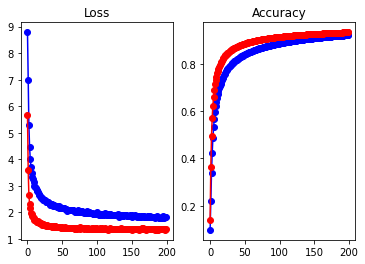

time: 227 ms (started: 2022-12-28 08:51:52 +00:00)


In [27]:
fig = plt.figure()
ax0 = fig.add_subplot(121, title="Loss")
ax1 = fig.add_subplot(122, title="Accuracy")
ax0.plot(train_loss_graph, 'bo-', label='train')
ax0.plot(val_loss_graph, 'ro-', label='val')
ax1.plot(acc_train_graph, 'bo-', label='train')
ax1.plot(acc_val_graph, 'ro-', label='val')

In [28]:
balanced_accuracy_score(actual_label, predicted_label)

0.9761904761904762

time: 10.3 ms (started: 2022-12-28 08:52:03 +00:00)


Confusion matrix: 


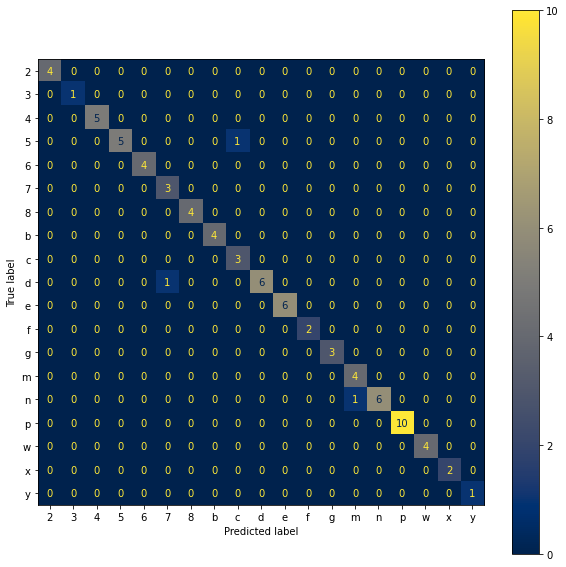

time: 842 ms (started: 2022-12-28 08:52:05 +00:00)


In [29]:
print('Confusion matrix: ')
fig, ax = plt.subplots(figsize=(10, 10))
cm = confusion_matrix(actual_label, predicted_label)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=sorted(info.values()))
disp.plot(cmap='cividis', ax=ax)
plt.show()

Oczyszczenie cache GPU w aktualnej sesji Colab dla dalszych testów.

In [30]:
model = None
gc.collect()
with torch.no_grad():
    torch.cuda.empty_cache()

time: 169 ms (started: 2022-12-28 08:52:39 +00:00)


# 3 Odszumianie obrazów metodą ich cyfrowego przetwarzania

## 3.1 Implementacja i trenowanie modelu

Prosta siec konwolucyjna, która posiada 142387 parametrów. Bardziej szczegółowo architektura sieci opisana w pkt 2.7 opisowej części pracy.

Implementacja modelu

In [31]:
class CNNmodel(nn.Module):
    def __init__(self):
        super(CNNmodel, self).__init__()
        self.layers = nn.Sequential(nn.Conv2d(1, 16,
                                              kernel_size=(3, 3),
                                              padding=1),
                                    nn.ReLU(inplace=False),
                                    nn.MaxPool2d(kernel_size=(2, 2)),
                                    nn.Conv2d(16, 16,
                                              kernel_size=(3, 3),
                                              padding=1),
                                    nn.ReLU(inplace=False),
                                    nn.MaxPool2d(kernel_size=(2, 2)),
                                    nn.Conv2d(16, 32,
                                              kernel_size=(3, 3),
                                              padding=1),
                                    nn.ReLU(inplace=False),
                                    nn.MaxPool2d(kernel_size=(2, 2)),
                                    nn.Conv2d(32, 32,
                                              kernel_size=(3, 3),
                                              padding=1),
                                    nn.ReLU(inplace=False),
                                    nn.MaxPool2d(kernel_size=(2, 2)))
        self.linear1 = nn.Linear(64, 1500)
        self.dropout1 = nn.Dropout(0.4)
        self.linear2 = nn.Linear(1500, categories)
        self.dropout2 = nn.Dropout(0.2)

    def forward(self, X):
        X = self.layers(X)
        X = torch.flatten(X, start_dim=1)
        X = self.dropout1(X)
        X = self.linear1(X)
        X = F.relu(X, inplace=False)
        X = self.dropout2(X)
        X = self.linear2(X)
        X = F.log_softmax(X, dim=1)

        return X

time: 3.64 ms (started: 2022-12-28 08:52:43 +00:00)


Parametry sieci:

In [32]:
model = CNNmodel()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
model.to(device)
epochs = 200
criterion = nn.MultiLabelSoftMarginLoss()
device = 'cuda' if torch.cuda.is_available() else 'cpu'
learning_rate = 1e-3

time: 7.18 ms (started: 2022-12-28 08:52:49 +00:00)


## 3.2 Przetwarzanie i przygotowanie zbioru danych

Przetwarzanie polega na progowaniu, operacjach morfologicznych, i użyciu filtrów do obrazów. Po przetwarzaniu obrazy są podzielone na 5 równowymiarowych obrazów, z których będzie zrobiony zbiór danych nieco niżej. Również niezbędnie jest podział otrzymanych danych na zbiór treningowy i walidacyjny.

In [33]:
X = []
y = []
for dirname, _, filenames in os.walk('/content/captcha-version-2-images/samples'):
    for filename in filenames:
        path = os.path.join(dirname, filename)
        image_read = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        image_adap = cv2.adaptiveThreshold(image_read, 255,
                                           cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                           cv2.THRESH_BINARY, 145, 0)
        kernel = np.ones((5, 5), np.uint8)
        image_close = cv2.morphologyEx(image_adap, cv2.MORPH_CLOSE, kernel)
        kernel = np.ones((2, 2), np.uint8)
        image_dil = cv2.dilate(image_close, kernel, iterations=1)
        image = cv2.GaussianBlur(image_dil, (5, 5), 0)
        x = [image[10:50, 30:50], image[10:50, 50:70],
             image[10:50, 70:90], image[10:50, 90:110], image[10:50, 110:130]]
        dim = (20, 40)
        transform = transforms.ToTensor()
        for i in range(5):
            X.append((transform(Image.fromarray(cv2.resize(x[i], dim,
                                                           interpolation=cv2.INTER_AREA)))).numpy())
            y.append(path[len(path)-9:len(path)-4][i])
X = np.array(X)
y = np.array(y)
y_le = LabelEncoder().fit_transform(y)
y_ohe = OneHotEncoder(sparse=False).fit_transform(y_le.reshape(len(y_le), 1))

categories = y_ohe.shape[1]

info = {y_le[i]: y[i] for i in range(len(y))}

time: 3.48 s (started: 2022-12-28 08:52:55 +00:00)


In [34]:
# Tworzenie datasetu z kilku tensorów z pasującym pierwszym wymiarem
# Próbki zostaną pobrane z pierwszego wymiaru (wiersza)

dataset = TensorDataset(Tensor(X), Tensor(y_ohe), )
total_size = len(dataset)
train_size = int(total_size * 0.6)
val_size = int(total_size - train_size)
train_dataset, val_dataset = random_split(dataset,
                                          [train_size, val_size],
                                          generator=torch.Generator().manual_seed(2))
train_loader = torch.utils.data.DataLoader(train_dataset,
                                           batch_size=150,
                                           shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset,
                                         batch_size=150,
                                         shuffle=True)

time: 3.49 ms (started: 2022-12-28 08:53:23 +00:00)


Pętla trenowania i ewaluacji

In [35]:
batches = len(train_loader)
val_batches = len(val_loader)
train_accuracy = torchmetrics.Accuracy()
val_accuracy = torchmetrics.Accuracy()
acc_train_graph = []
acc_val_graph = []
train_loss_graph = []
val_loss_graph = []
train_acc_update = 0
val_acc_update = 0
for epoch in range(epochs):
    train_loss_unit = 0
    val_loss_unit = 0
    progress_train = tqdm(enumerate(train_loader),
                          desc="Loss: ",
                          total=batches)
    # ----------------- TRENOWANIJE  --------------------
    model.train()
    for i, data in progress_train:
        data[0] = data[0].permute(0, 1, 2, 3)
        pic, index = data[0].to(device), data[1].to(device)
        optimizer.zero_grad()
        outputs = model(pic)
        loss = criterion(outputs, index)
        loss.backward()
        optimizer.step()
        train_loss_unit += loss.item()
        train_acc_update = train_accuracy.update(outputs.cpu(),
                                                 torch.argmax(index.squeeze().cpu(),
                                                              dim=1))
    train_loss_graph.append(train_loss_unit)
    total_train_accuracy = train_accuracy.compute()
    acc_train_graph.append(total_train_accuracy)
    print('Epoch: %03d/%03d | Train loss %.3f | Train accuracy: %.3f%%' % (epoch+1, epochs, (sum(train_loss_graph)/len(train_loss_graph)), (total_train_accuracy)))
    # ----------------- WALIDACJA  --------------------
    model.eval()
    progress_val = tqdm(enumerate(val_loader),
                        desc="Loss: ",
                        total=val_batches)
    with torch.no_grad():
        for i, data in progress_val:
            data[0] = data[0].permute(0, 1, 2, 3)  # (0, 3, 1, 2)
            pic, index = data[0].to(device), data[1].to(device)
            optimizer.zero_grad()
            outputs = model(pic)
            loss = criterion(outputs, index)
            actual_label = torch.argmax(index.cpu(), dim=1)
            predicted_label = torch.argmax(outputs, dim=1).cpu()
            val_loss_unit += loss.item()
            val_acc_update = val_accuracy.update(outputs.cpu(),
                                                 torch.argmax(index.squeeze().cpu(),
                                                              dim=1))
    val_loss_graph.append(val_loss_unit)
    total_val_accuracy = val_accuracy.compute()
    acc_val.append(total_val_accuracy)
    print('Epoch: %03d/%03d | Validation loss %.3f | Validation accuracy: %.3f%%' % (epoch+1, epochs, (sum(val_loss_graph)/len(val_loss_graph)), (total_val_accuracy)))

Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 001/200 | Train loss 8.779 | Train accuracy: 0.100%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 001/200 | Validation loss 5.589 | Validation accuracy: 0.150%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 002/200 | Train loss 7.881 | Train accuracy: 0.218%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 002/200 | Validation loss 4.598 | Validation accuracy: 0.366%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 003/200 | Train loss 7.105 | Train accuracy: 0.323%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 003/200 | Validation loss 4.087 | Validation accuracy: 0.469%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 004/200 | Train loss 6.552 | Train accuracy: 0.395%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 004/200 | Validation loss 3.730 | Validation accuracy: 0.535%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 005/200 | Train loss 6.127 | Train accuracy: 0.451%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 005/200 | Validation loss 3.463 | Validation accuracy: 0.585%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 006/200 | Train loss 5.793 | Train accuracy: 0.492%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 006/200 | Validation loss 3.257 | Validation accuracy: 0.622%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 007/200 | Train loss 5.524 | Train accuracy: 0.526%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 007/200 | Validation loss 3.094 | Validation accuracy: 0.651%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 008/200 | Train loss 5.303 | Train accuracy: 0.554%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 008/200 | Validation loss 2.961 | Validation accuracy: 0.675%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 009/200 | Train loss 5.115 | Train accuracy: 0.577%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 009/200 | Validation loss 2.854 | Validation accuracy: 0.694%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 010/200 | Train loss 4.953 | Train accuracy: 0.597%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 010/200 | Validation loss 2.764 | Validation accuracy: 0.709%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 011/200 | Train loss 4.816 | Train accuracy: 0.614%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 011/200 | Validation loss 2.684 | Validation accuracy: 0.723%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 012/200 | Train loss 4.690 | Train accuracy: 0.629%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 012/200 | Validation loss 2.615 | Validation accuracy: 0.735%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 013/200 | Train loss 4.576 | Train accuracy: 0.643%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 013/200 | Validation loss 2.553 | Validation accuracy: 0.746%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 014/200 | Train loss 4.474 | Train accuracy: 0.655%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 014/200 | Validation loss 2.498 | Validation accuracy: 0.755%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 015/200 | Train loss 4.383 | Train accuracy: 0.666%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 015/200 | Validation loss 2.450 | Validation accuracy: 0.764%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 016/200 | Train loss 4.298 | Train accuracy: 0.675%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 016/200 | Validation loss 2.406 | Validation accuracy: 0.772%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 017/200 | Train loss 4.225 | Train accuracy: 0.684%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 017/200 | Validation loss 2.367 | Validation accuracy: 0.778%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 018/200 | Train loss 4.156 | Train accuracy: 0.691%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 018/200 | Validation loss 2.331 | Validation accuracy: 0.784%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 019/200 | Train loss 4.092 | Train accuracy: 0.699%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 019/200 | Validation loss 2.299 | Validation accuracy: 0.790%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 020/200 | Train loss 4.031 | Train accuracy: 0.706%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 020/200 | Validation loss 2.269 | Validation accuracy: 0.795%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 021/200 | Train loss 3.974 | Train accuracy: 0.712%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 021/200 | Validation loss 2.241 | Validation accuracy: 0.800%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 022/200 | Train loss 3.922 | Train accuracy: 0.718%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 022/200 | Validation loss 2.216 | Validation accuracy: 0.804%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 023/200 | Train loss 3.875 | Train accuracy: 0.723%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 023/200 | Validation loss 2.194 | Validation accuracy: 0.808%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 024/200 | Train loss 3.833 | Train accuracy: 0.728%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 024/200 | Validation loss 2.172 | Validation accuracy: 0.811%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 025/200 | Train loss 3.790 | Train accuracy: 0.733%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 025/200 | Validation loss 2.151 | Validation accuracy: 0.815%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 026/200 | Train loss 3.750 | Train accuracy: 0.737%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 026/200 | Validation loss 2.132 | Validation accuracy: 0.818%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 027/200 | Train loss 3.713 | Train accuracy: 0.742%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 027/200 | Validation loss 2.113 | Validation accuracy: 0.821%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 028/200 | Train loss 3.676 | Train accuracy: 0.746%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 028/200 | Validation loss 2.096 | Validation accuracy: 0.824%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 029/200 | Train loss 3.642 | Train accuracy: 0.749%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 029/200 | Validation loss 2.080 | Validation accuracy: 0.827%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 030/200 | Train loss 3.608 | Train accuracy: 0.753%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 030/200 | Validation loss 2.064 | Validation accuracy: 0.829%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 031/200 | Train loss 3.576 | Train accuracy: 0.757%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 031/200 | Validation loss 2.050 | Validation accuracy: 0.832%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 032/200 | Train loss 3.546 | Train accuracy: 0.760%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 032/200 | Validation loss 2.036 | Validation accuracy: 0.834%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 033/200 | Train loss 3.517 | Train accuracy: 0.764%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 033/200 | Validation loss 2.022 | Validation accuracy: 0.836%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 034/200 | Train loss 3.489 | Train accuracy: 0.767%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 034/200 | Validation loss 2.011 | Validation accuracy: 0.838%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 035/200 | Train loss 3.462 | Train accuracy: 0.770%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 035/200 | Validation loss 1.998 | Validation accuracy: 0.840%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 036/200 | Train loss 3.438 | Train accuracy: 0.772%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 036/200 | Validation loss 1.987 | Validation accuracy: 0.842%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 037/200 | Train loss 3.413 | Train accuracy: 0.775%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 037/200 | Validation loss 1.975 | Validation accuracy: 0.844%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 038/200 | Train loss 3.390 | Train accuracy: 0.778%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 038/200 | Validation loss 1.964 | Validation accuracy: 0.846%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 039/200 | Train loss 3.367 | Train accuracy: 0.780%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 039/200 | Validation loss 1.954 | Validation accuracy: 0.848%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 040/200 | Train loss 3.346 | Train accuracy: 0.783%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 040/200 | Validation loss 1.943 | Validation accuracy: 0.849%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 041/200 | Train loss 3.325 | Train accuracy: 0.785%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 041/200 | Validation loss 1.934 | Validation accuracy: 0.851%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 042/200 | Train loss 3.305 | Train accuracy: 0.787%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 042/200 | Validation loss 1.925 | Validation accuracy: 0.852%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 043/200 | Train loss 3.286 | Train accuracy: 0.790%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 043/200 | Validation loss 1.916 | Validation accuracy: 0.854%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 044/200 | Train loss 3.267 | Train accuracy: 0.792%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 044/200 | Validation loss 1.908 | Validation accuracy: 0.855%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 045/200 | Train loss 3.248 | Train accuracy: 0.794%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 045/200 | Validation loss 1.899 | Validation accuracy: 0.857%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 046/200 | Train loss 3.231 | Train accuracy: 0.796%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 046/200 | Validation loss 1.891 | Validation accuracy: 0.858%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 047/200 | Train loss 3.213 | Train accuracy: 0.798%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 047/200 | Validation loss 1.883 | Validation accuracy: 0.859%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 048/200 | Train loss 3.198 | Train accuracy: 0.799%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 048/200 | Validation loss 1.876 | Validation accuracy: 0.860%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 049/200 | Train loss 3.182 | Train accuracy: 0.801%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 049/200 | Validation loss 1.868 | Validation accuracy: 0.862%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 050/200 | Train loss 3.166 | Train accuracy: 0.803%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 050/200 | Validation loss 1.862 | Validation accuracy: 0.863%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 051/200 | Train loss 3.152 | Train accuracy: 0.804%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 051/200 | Validation loss 1.855 | Validation accuracy: 0.864%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 052/200 | Train loss 3.137 | Train accuracy: 0.806%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 052/200 | Validation loss 1.849 | Validation accuracy: 0.865%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 053/200 | Train loss 3.122 | Train accuracy: 0.808%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 053/200 | Validation loss 1.842 | Validation accuracy: 0.866%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 054/200 | Train loss 3.108 | Train accuracy: 0.809%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 054/200 | Validation loss 1.836 | Validation accuracy: 0.867%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 055/200 | Train loss 3.094 | Train accuracy: 0.811%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 055/200 | Validation loss 1.830 | Validation accuracy: 0.868%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 056/200 | Train loss 3.081 | Train accuracy: 0.812%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 056/200 | Validation loss 1.824 | Validation accuracy: 0.869%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 057/200 | Train loss 3.068 | Train accuracy: 0.814%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 057/200 | Validation loss 1.819 | Validation accuracy: 0.870%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 058/200 | Train loss 3.055 | Train accuracy: 0.815%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 058/200 | Validation loss 1.813 | Validation accuracy: 0.871%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 059/200 | Train loss 3.042 | Train accuracy: 0.817%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 059/200 | Validation loss 1.807 | Validation accuracy: 0.872%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 060/200 | Train loss 3.030 | Train accuracy: 0.818%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 060/200 | Validation loss 1.802 | Validation accuracy: 0.873%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 061/200 | Train loss 3.018 | Train accuracy: 0.819%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 061/200 | Validation loss 1.797 | Validation accuracy: 0.874%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 062/200 | Train loss 3.006 | Train accuracy: 0.821%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 062/200 | Validation loss 1.793 | Validation accuracy: 0.874%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 063/200 | Train loss 2.995 | Train accuracy: 0.822%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 063/200 | Validation loss 1.788 | Validation accuracy: 0.875%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 064/200 | Train loss 2.984 | Train accuracy: 0.823%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 064/200 | Validation loss 1.783 | Validation accuracy: 0.876%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 065/200 | Train loss 2.973 | Train accuracy: 0.824%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 065/200 | Validation loss 1.778 | Validation accuracy: 0.877%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 066/200 | Train loss 2.963 | Train accuracy: 0.825%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 066/200 | Validation loss 1.774 | Validation accuracy: 0.878%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 067/200 | Train loss 2.953 | Train accuracy: 0.827%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 067/200 | Validation loss 1.770 | Validation accuracy: 0.878%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 068/200 | Train loss 2.943 | Train accuracy: 0.828%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 068/200 | Validation loss 1.766 | Validation accuracy: 0.879%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 069/200 | Train loss 2.932 | Train accuracy: 0.829%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 069/200 | Validation loss 1.761 | Validation accuracy: 0.880%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 070/200 | Train loss 2.922 | Train accuracy: 0.830%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 070/200 | Validation loss 1.757 | Validation accuracy: 0.880%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 071/200 | Train loss 2.913 | Train accuracy: 0.831%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 071/200 | Validation loss 1.753 | Validation accuracy: 0.881%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 072/200 | Train loss 2.903 | Train accuracy: 0.832%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 072/200 | Validation loss 1.749 | Validation accuracy: 0.882%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 073/200 | Train loss 2.894 | Train accuracy: 0.833%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 073/200 | Validation loss 1.745 | Validation accuracy: 0.882%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 074/200 | Train loss 2.885 | Train accuracy: 0.834%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 074/200 | Validation loss 1.742 | Validation accuracy: 0.883%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 075/200 | Train loss 2.876 | Train accuracy: 0.835%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 075/200 | Validation loss 1.738 | Validation accuracy: 0.884%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 076/200 | Train loss 2.867 | Train accuracy: 0.836%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 076/200 | Validation loss 1.734 | Validation accuracy: 0.884%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 077/200 | Train loss 2.859 | Train accuracy: 0.837%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 077/200 | Validation loss 1.731 | Validation accuracy: 0.885%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 078/200 | Train loss 2.850 | Train accuracy: 0.838%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 078/200 | Validation loss 1.728 | Validation accuracy: 0.886%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 079/200 | Train loss 2.842 | Train accuracy: 0.839%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 079/200 | Validation loss 1.724 | Validation accuracy: 0.886%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 080/200 | Train loss 2.834 | Train accuracy: 0.840%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 080/200 | Validation loss 1.721 | Validation accuracy: 0.887%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 081/200 | Train loss 2.826 | Train accuracy: 0.841%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 081/200 | Validation loss 1.718 | Validation accuracy: 0.887%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 082/200 | Train loss 2.819 | Train accuracy: 0.842%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 082/200 | Validation loss 1.715 | Validation accuracy: 0.888%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 083/200 | Train loss 2.811 | Train accuracy: 0.843%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 083/200 | Validation loss 1.712 | Validation accuracy: 0.888%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 084/200 | Train loss 2.804 | Train accuracy: 0.843%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 084/200 | Validation loss 1.709 | Validation accuracy: 0.889%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 085/200 | Train loss 2.797 | Train accuracy: 0.844%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 085/200 | Validation loss 1.706 | Validation accuracy: 0.889%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 086/200 | Train loss 2.790 | Train accuracy: 0.845%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 086/200 | Validation loss 1.703 | Validation accuracy: 0.890%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 087/200 | Train loss 2.783 | Train accuracy: 0.846%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 087/200 | Validation loss 1.700 | Validation accuracy: 0.890%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 088/200 | Train loss 2.776 | Train accuracy: 0.847%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 088/200 | Validation loss 1.698 | Validation accuracy: 0.891%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 089/200 | Train loss 2.769 | Train accuracy: 0.847%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 089/200 | Validation loss 1.695 | Validation accuracy: 0.891%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 090/200 | Train loss 2.763 | Train accuracy: 0.848%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 090/200 | Validation loss 1.692 | Validation accuracy: 0.892%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 091/200 | Train loss 2.757 | Train accuracy: 0.849%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 091/200 | Validation loss 1.689 | Validation accuracy: 0.892%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 092/200 | Train loss 2.750 | Train accuracy: 0.849%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 092/200 | Validation loss 1.687 | Validation accuracy: 0.893%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 093/200 | Train loss 2.744 | Train accuracy: 0.850%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 093/200 | Validation loss 1.684 | Validation accuracy: 0.893%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 094/200 | Train loss 2.738 | Train accuracy: 0.851%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 094/200 | Validation loss 1.682 | Validation accuracy: 0.894%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 095/200 | Train loss 2.732 | Train accuracy: 0.852%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 095/200 | Validation loss 1.679 | Validation accuracy: 0.894%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 096/200 | Train loss 2.726 | Train accuracy: 0.852%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 096/200 | Validation loss 1.677 | Validation accuracy: 0.895%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 097/200 | Train loss 2.720 | Train accuracy: 0.853%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 097/200 | Validation loss 1.675 | Validation accuracy: 0.895%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 098/200 | Train loss 2.714 | Train accuracy: 0.854%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 098/200 | Validation loss 1.672 | Validation accuracy: 0.896%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 099/200 | Train loss 2.708 | Train accuracy: 0.854%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 099/200 | Validation loss 1.670 | Validation accuracy: 0.896%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 100/200 | Train loss 2.702 | Train accuracy: 0.855%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 100/200 | Validation loss 1.668 | Validation accuracy: 0.896%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 101/200 | Train loss 2.696 | Train accuracy: 0.856%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 101/200 | Validation loss 1.666 | Validation accuracy: 0.897%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 102/200 | Train loss 2.691 | Train accuracy: 0.856%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 102/200 | Validation loss 1.663 | Validation accuracy: 0.897%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 103/200 | Train loss 2.685 | Train accuracy: 0.857%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 103/200 | Validation loss 1.661 | Validation accuracy: 0.898%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 104/200 | Train loss 2.680 | Train accuracy: 0.858%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 104/200 | Validation loss 1.659 | Validation accuracy: 0.898%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 105/200 | Train loss 2.675 | Train accuracy: 0.858%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 105/200 | Validation loss 1.657 | Validation accuracy: 0.898%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 106/200 | Train loss 2.670 | Train accuracy: 0.859%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 106/200 | Validation loss 1.655 | Validation accuracy: 0.899%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 107/200 | Train loss 2.665 | Train accuracy: 0.859%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 107/200 | Validation loss 1.653 | Validation accuracy: 0.899%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 108/200 | Train loss 2.659 | Train accuracy: 0.860%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 108/200 | Validation loss 1.651 | Validation accuracy: 0.899%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 109/200 | Train loss 2.654 | Train accuracy: 0.861%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 109/200 | Validation loss 1.649 | Validation accuracy: 0.900%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 110/200 | Train loss 2.650 | Train accuracy: 0.861%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 110/200 | Validation loss 1.647 | Validation accuracy: 0.900%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 111/200 | Train loss 2.645 | Train accuracy: 0.862%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 111/200 | Validation loss 1.645 | Validation accuracy: 0.900%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 112/200 | Train loss 2.640 | Train accuracy: 0.862%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 112/200 | Validation loss 1.644 | Validation accuracy: 0.901%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 113/200 | Train loss 2.635 | Train accuracy: 0.863%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 113/200 | Validation loss 1.642 | Validation accuracy: 0.901%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 114/200 | Train loss 2.630 | Train accuracy: 0.863%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 114/200 | Validation loss 1.640 | Validation accuracy: 0.901%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 115/200 | Train loss 2.625 | Train accuracy: 0.864%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 115/200 | Validation loss 1.638 | Validation accuracy: 0.902%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 116/200 | Train loss 2.620 | Train accuracy: 0.865%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 116/200 | Validation loss 1.636 | Validation accuracy: 0.902%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 117/200 | Train loss 2.616 | Train accuracy: 0.865%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 117/200 | Validation loss 1.635 | Validation accuracy: 0.902%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 118/200 | Train loss 2.611 | Train accuracy: 0.866%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 118/200 | Validation loss 1.633 | Validation accuracy: 0.903%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 119/200 | Train loss 2.607 | Train accuracy: 0.866%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 119/200 | Validation loss 1.631 | Validation accuracy: 0.903%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 120/200 | Train loss 2.602 | Train accuracy: 0.867%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 120/200 | Validation loss 1.630 | Validation accuracy: 0.903%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 121/200 | Train loss 2.598 | Train accuracy: 0.867%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 121/200 | Validation loss 1.628 | Validation accuracy: 0.904%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 122/200 | Train loss 2.594 | Train accuracy: 0.868%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 122/200 | Validation loss 1.626 | Validation accuracy: 0.904%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 123/200 | Train loss 2.589 | Train accuracy: 0.868%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 123/200 | Validation loss 1.625 | Validation accuracy: 0.904%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 124/200 | Train loss 2.585 | Train accuracy: 0.869%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 124/200 | Validation loss 1.623 | Validation accuracy: 0.905%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 125/200 | Train loss 2.581 | Train accuracy: 0.869%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 125/200 | Validation loss 1.622 | Validation accuracy: 0.905%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 126/200 | Train loss 2.577 | Train accuracy: 0.870%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 126/200 | Validation loss 1.620 | Validation accuracy: 0.905%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 127/200 | Train loss 2.573 | Train accuracy: 0.870%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 127/200 | Validation loss 1.619 | Validation accuracy: 0.905%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 128/200 | Train loss 2.569 | Train accuracy: 0.871%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 128/200 | Validation loss 1.617 | Validation accuracy: 0.906%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 129/200 | Train loss 2.564 | Train accuracy: 0.871%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 129/200 | Validation loss 1.616 | Validation accuracy: 0.906%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 130/200 | Train loss 2.560 | Train accuracy: 0.872%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 130/200 | Validation loss 1.614 | Validation accuracy: 0.906%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 131/200 | Train loss 2.556 | Train accuracy: 0.872%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 131/200 | Validation loss 1.613 | Validation accuracy: 0.907%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 132/200 | Train loss 2.553 | Train accuracy: 0.873%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 132/200 | Validation loss 1.611 | Validation accuracy: 0.907%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 133/200 | Train loss 2.549 | Train accuracy: 0.873%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 133/200 | Validation loss 1.610 | Validation accuracy: 0.907%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 134/200 | Train loss 2.546 | Train accuracy: 0.873%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 134/200 | Validation loss 1.609 | Validation accuracy: 0.907%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 135/200 | Train loss 2.542 | Train accuracy: 0.874%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 135/200 | Validation loss 1.608 | Validation accuracy: 0.908%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 136/200 | Train loss 2.538 | Train accuracy: 0.874%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 136/200 | Validation loss 1.606 | Validation accuracy: 0.908%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 137/200 | Train loss 2.534 | Train accuracy: 0.875%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 137/200 | Validation loss 1.605 | Validation accuracy: 0.908%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 138/200 | Train loss 2.531 | Train accuracy: 0.875%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 138/200 | Validation loss 1.604 | Validation accuracy: 0.908%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 139/200 | Train loss 2.527 | Train accuracy: 0.876%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 139/200 | Validation loss 1.603 | Validation accuracy: 0.909%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 140/200 | Train loss 2.524 | Train accuracy: 0.876%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 140/200 | Validation loss 1.601 | Validation accuracy: 0.909%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 141/200 | Train loss 2.520 | Train accuracy: 0.877%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 141/200 | Validation loss 1.600 | Validation accuracy: 0.909%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 142/200 | Train loss 2.517 | Train accuracy: 0.877%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 142/200 | Validation loss 1.599 | Validation accuracy: 0.909%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 143/200 | Train loss 2.514 | Train accuracy: 0.877%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 143/200 | Validation loss 1.598 | Validation accuracy: 0.909%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 144/200 | Train loss 2.510 | Train accuracy: 0.878%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 144/200 | Validation loss 1.597 | Validation accuracy: 0.910%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 145/200 | Train loss 2.507 | Train accuracy: 0.878%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 145/200 | Validation loss 1.596 | Validation accuracy: 0.910%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 146/200 | Train loss 2.504 | Train accuracy: 0.878%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 146/200 | Validation loss 1.595 | Validation accuracy: 0.910%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 147/200 | Train loss 2.500 | Train accuracy: 0.879%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 147/200 | Validation loss 1.594 | Validation accuracy: 0.910%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 148/200 | Train loss 2.497 | Train accuracy: 0.879%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 148/200 | Validation loss 1.593 | Validation accuracy: 0.911%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 149/200 | Train loss 2.494 | Train accuracy: 0.880%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 149/200 | Validation loss 1.591 | Validation accuracy: 0.911%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 150/200 | Train loss 2.490 | Train accuracy: 0.880%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 150/200 | Validation loss 1.590 | Validation accuracy: 0.911%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 151/200 | Train loss 2.487 | Train accuracy: 0.881%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 151/200 | Validation loss 1.589 | Validation accuracy: 0.911%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 152/200 | Train loss 2.484 | Train accuracy: 0.881%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 152/200 | Validation loss 1.588 | Validation accuracy: 0.911%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 153/200 | Train loss 2.481 | Train accuracy: 0.881%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 153/200 | Validation loss 1.587 | Validation accuracy: 0.912%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 154/200 | Train loss 2.478 | Train accuracy: 0.882%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 154/200 | Validation loss 1.586 | Validation accuracy: 0.912%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 155/200 | Train loss 2.475 | Train accuracy: 0.882%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 155/200 | Validation loss 1.585 | Validation accuracy: 0.912%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 156/200 | Train loss 2.472 | Train accuracy: 0.882%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 156/200 | Validation loss 1.584 | Validation accuracy: 0.912%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 157/200 | Train loss 2.469 | Train accuracy: 0.883%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 157/200 | Validation loss 1.583 | Validation accuracy: 0.912%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 158/200 | Train loss 2.466 | Train accuracy: 0.883%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 158/200 | Validation loss 1.582 | Validation accuracy: 0.913%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 159/200 | Train loss 2.463 | Train accuracy: 0.884%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 159/200 | Validation loss 1.581 | Validation accuracy: 0.913%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 160/200 | Train loss 2.460 | Train accuracy: 0.884%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 160/200 | Validation loss 1.580 | Validation accuracy: 0.913%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 161/200 | Train loss 2.457 | Train accuracy: 0.884%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 161/200 | Validation loss 1.579 | Validation accuracy: 0.913%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 162/200 | Train loss 2.454 | Train accuracy: 0.885%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 162/200 | Validation loss 1.578 | Validation accuracy: 0.914%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 163/200 | Train loss 2.451 | Train accuracy: 0.885%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 163/200 | Validation loss 1.577 | Validation accuracy: 0.914%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 164/200 | Train loss 2.449 | Train accuracy: 0.885%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 164/200 | Validation loss 1.576 | Validation accuracy: 0.914%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 165/200 | Train loss 2.446 | Train accuracy: 0.886%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 165/200 | Validation loss 1.575 | Validation accuracy: 0.914%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 166/200 | Train loss 2.443 | Train accuracy: 0.886%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 166/200 | Validation loss 1.574 | Validation accuracy: 0.914%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 167/200 | Train loss 2.440 | Train accuracy: 0.886%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 167/200 | Validation loss 1.573 | Validation accuracy: 0.914%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 168/200 | Train loss 2.438 | Train accuracy: 0.887%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 168/200 | Validation loss 1.572 | Validation accuracy: 0.915%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 169/200 | Train loss 2.435 | Train accuracy: 0.887%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 169/200 | Validation loss 1.571 | Validation accuracy: 0.915%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 170/200 | Train loss 2.432 | Train accuracy: 0.887%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 170/200 | Validation loss 1.570 | Validation accuracy: 0.915%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 171/200 | Train loss 2.429 | Train accuracy: 0.888%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 171/200 | Validation loss 1.569 | Validation accuracy: 0.915%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 172/200 | Train loss 2.427 | Train accuracy: 0.888%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 172/200 | Validation loss 1.568 | Validation accuracy: 0.915%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 173/200 | Train loss 2.424 | Train accuracy: 0.888%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 173/200 | Validation loss 1.567 | Validation accuracy: 0.916%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 174/200 | Train loss 2.421 | Train accuracy: 0.889%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 174/200 | Validation loss 1.567 | Validation accuracy: 0.916%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 175/200 | Train loss 2.419 | Train accuracy: 0.889%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 175/200 | Validation loss 1.566 | Validation accuracy: 0.916%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 176/200 | Train loss 2.416 | Train accuracy: 0.889%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 176/200 | Validation loss 1.565 | Validation accuracy: 0.916%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 177/200 | Train loss 2.413 | Train accuracy: 0.890%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 177/200 | Validation loss 1.564 | Validation accuracy: 0.916%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 178/200 | Train loss 2.411 | Train accuracy: 0.890%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 178/200 | Validation loss 1.563 | Validation accuracy: 0.917%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 179/200 | Train loss 2.408 | Train accuracy: 0.890%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 179/200 | Validation loss 1.562 | Validation accuracy: 0.917%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 180/200 | Train loss 2.406 | Train accuracy: 0.890%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 180/200 | Validation loss 1.561 | Validation accuracy: 0.917%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 181/200 | Train loss 2.403 | Train accuracy: 0.891%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 181/200 | Validation loss 1.561 | Validation accuracy: 0.917%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 182/200 | Train loss 2.401 | Train accuracy: 0.891%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 182/200 | Validation loss 1.560 | Validation accuracy: 0.917%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 183/200 | Train loss 2.399 | Train accuracy: 0.891%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 183/200 | Validation loss 1.559 | Validation accuracy: 0.917%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 184/200 | Train loss 2.396 | Train accuracy: 0.892%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 184/200 | Validation loss 1.558 | Validation accuracy: 0.918%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 185/200 | Train loss 2.394 | Train accuracy: 0.892%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 185/200 | Validation loss 1.557 | Validation accuracy: 0.918%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 186/200 | Train loss 2.392 | Train accuracy: 0.892%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 186/200 | Validation loss 1.557 | Validation accuracy: 0.918%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 187/200 | Train loss 2.389 | Train accuracy: 0.893%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 187/200 | Validation loss 1.556 | Validation accuracy: 0.918%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 188/200 | Train loss 2.387 | Train accuracy: 0.893%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 188/200 | Validation loss 1.555 | Validation accuracy: 0.918%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 189/200 | Train loss 2.384 | Train accuracy: 0.893%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 189/200 | Validation loss 1.554 | Validation accuracy: 0.918%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 190/200 | Train loss 2.382 | Train accuracy: 0.893%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 190/200 | Validation loss 1.553 | Validation accuracy: 0.919%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 191/200 | Train loss 2.380 | Train accuracy: 0.894%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 191/200 | Validation loss 1.553 | Validation accuracy: 0.919%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 192/200 | Train loss 2.378 | Train accuracy: 0.894%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 192/200 | Validation loss 1.552 | Validation accuracy: 0.919%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 193/200 | Train loss 2.375 | Train accuracy: 0.894%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 193/200 | Validation loss 1.551 | Validation accuracy: 0.919%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 194/200 | Train loss 2.373 | Train accuracy: 0.895%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 194/200 | Validation loss 1.551 | Validation accuracy: 0.919%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 195/200 | Train loss 2.371 | Train accuracy: 0.895%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 195/200 | Validation loss 1.550 | Validation accuracy: 0.919%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 196/200 | Train loss 2.369 | Train accuracy: 0.895%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 196/200 | Validation loss 1.549 | Validation accuracy: 0.920%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 197/200 | Train loss 2.367 | Train accuracy: 0.895%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 197/200 | Validation loss 1.548 | Validation accuracy: 0.920%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 198/200 | Train loss 2.365 | Train accuracy: 0.896%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 198/200 | Validation loss 1.548 | Validation accuracy: 0.920%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 199/200 | Train loss 2.362 | Train accuracy: 0.896%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 199/200 | Validation loss 1.547 | Validation accuracy: 0.920%


Loss:   0%|          | 0/43 [00:00<?, ?it/s]

Epoch: 200/200 | Train loss 2.360 | Train accuracy: 0.896%


Loss:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch: 200/200 | Validation loss 1.546 | Validation accuracy: 0.920%
time: 1min 47s (started: 2022-12-28 08:53:28 +00:00)


## 3.3 Wyniki wytrenowanego modelu

Aby ocenić efektywność podejścia zostały zastosowane kilka różnych metod do obliczenia dokładnych wartości. Metody są opisane w opisowej części pracy w pkt. 4. Poniżej przedstawiono wyniki działania wytrenowanego modelu takie jak:


1.   Wykres funkcji straty i skuteczności;
2.   Zbilansowana skuteczność;
3.   Matryca pomyłek.


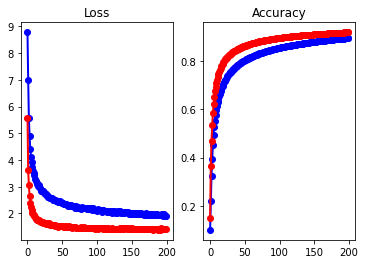

time: 189 ms (started: 2022-12-28 08:56:37 +00:00)


In [36]:
# Wykres funkcji straty i skuteczności (wartości podane co epoke)
# otrzymane pod czas trenowania oraz walidacyji sieci

fig = plt.figure()
ax0 = fig.add_subplot(121, title="Loss")
ax1 = fig.add_subplot(122, title="Accuracy")
ax0.plot(train_loss_graph, 'bo-', label='train', linewidth=2)
ax0.plot(val_loss_graph, 'ro-', label='val', linewidth=2)
ax1.plot(acc_train_graph, 'bo-', label='train', linewidth=2)
ax1.plot(acc_val_graph, 'ro-', label='val', linewidth=2)
plt.show()

In [37]:
balanced_accuracy_score(actual_label, predicted_label)

0.9661654135338346

time: 4.8 ms (started: 2022-12-28 08:56:42 +00:00)


Confusion matrix: 


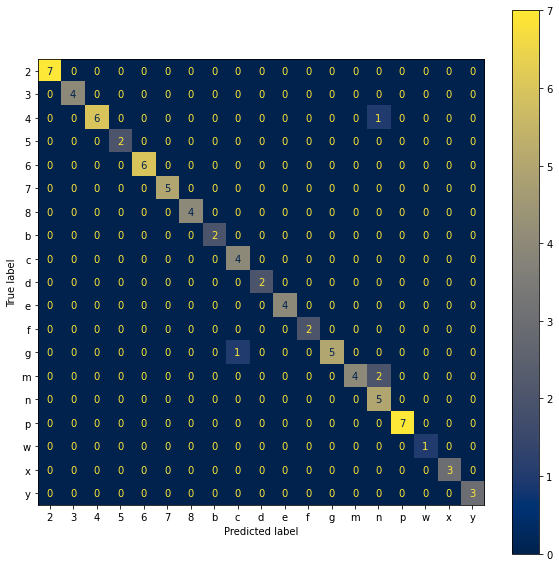

time: 835 ms (started: 2022-12-28 08:56:44 +00:00)


In [38]:
print('Confusion matrix: ')
fig, ax = plt.subplots(figsize=(10, 10))
cm = confusion_matrix(actual_label, predicted_label)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=sorted(info.values()))
disp.plot(cmap='cividis', ax=ax)
plt.show()